# Import

In [1]:
%matplotlib inline
import os, sys
import numpy as np
import pandas as pd
from IPython.display import display # Allows the use of display() for DataFrames
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
import pickle
import xgboost as xgb
from sklearn.model_selection import validation_curve
from catboost import CatBoostClassifier, Pool, cv
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import VarianceThreshold
from xgboost.sklearn import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.feature_selection import RFECV
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from mlxtend.classifier import StackingClassifier
import xgbfir
from sklearn.neural_network import MLPClassifier
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import VotingClassifier
from mlxtend.feature_selection import ColumnSelector
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

from sklearn.naive_bayes import MultinomialNB, BernoulliNB


import arrow

import warnings
warnings.filterwarnings('ignore')

from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation
from keras.optimizers import SGD
from keras.utils import np_utils
from keras.utils import to_categorical
from sklearn.metrics import roc_curve, auc

import keras

Using TensorFlow backend.


# Load Data

In [2]:
try:
    data = pd.read_csv("./data/traindata.csv")
    data.drop(['ID'], axis = 1, inplace = True)
    print("Dataset has {} samples with {} features each.".format(*data.shape))
except:
    print("Dataset could not be loaded. Is the dataset missing?")

Dataset has 8000 samples with 28 features each.


In [3]:
y = data['class']
X = data.drop(['class'], axis=1)

X_train, X_validation, y_train, y_validation = train_test_split(X, y, test_size=0.1, random_state=42)



In [4]:
seed = 42
scv_10 = StratifiedKFold(n_splits = 10, shuffle = True, random_state = seed)

scv_5 = StratifiedKFold(n_splits = 5, shuffle = True, random_state = seed)

scv_3 = StratifiedKFold(n_splits = 3, shuffle = True, random_state = seed)

# Preprocessing

In [5]:
#%%
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_minmax_transform = scaler.fit_transform(X)

#%%
from sklearn.preprocessing import StandardScaler
scaler_std = StandardScaler()
X_standard_transform = scaler_std.fit_transform(X)

#%%
from sklearn.preprocessing import RobustScaler
scaler_rbs = RobustScaler()
X_robust_transform = scaler_rbs.fit_transform(X)

#%%
from sklearn.preprocessing import Normalizer
X_normalized = X.copy()
normalizer = Normalizer(copy=True, norm='l2')
X_normalized = normalizer.fit_transform(X_normalized.values)

#%%
from sklearn.feature_selection import SelectFromModel
from sklearn.svm import LinearSVC
lsvc = LinearSVC(C=0.01, penalty="l1", dual=False).fit(X_robust_transform, y)
model_select = SelectFromModel(lsvc, prefit=True)
X_new = model_select.transform(X_robust_transform)

#%%
from sklearn.feature_selection import SelectFromModel
from sklearn.svm import LinearSVC
lsvc_raw = LinearSVC(C=0.01, penalty="l1", dual=False).fit(X, y)
model_select_raw = SelectFromModel(lsvc_raw, prefit=True)
X_new_raw = model_select_raw.transform(X)

# Feature Selection

### feature variance plot

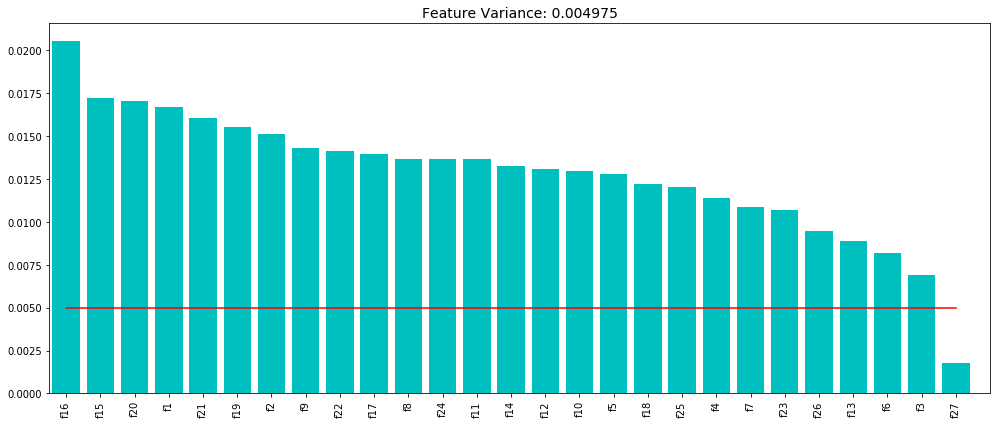

In [11]:
#Set the threshold values and run VarianceThreshold 
thres = .995* (1 - .995)
sel = VarianceThreshold(threshold=thres)
sel.fit(X_minmax_transform)
variance = sel.variances_

#Sorting of the score in acsending orders for plotting
indices = np.argsort(variance)[::-1]
feature_list = list(X)
sorted_feature_list = []
thres_list = []
for f in range(len(X.columns)):
    sorted_feature_list.append(feature_list[indices[f]])
    thres_list.append(thres)
    
plt.figure(figsize=(14,6))
plt.title("Feature Variance: %f" %(thres), fontsize = 14)
plt.bar(range(len(X.columns)), variance[indices], color="c")
plt.xticks(range(len(X.columns)), sorted_feature_list, rotation = 90)
plt.xlim([-0.5, len(X.columns)])
plt.plot(range(len(X.columns)), thres_list, "k-", color="r")
plt.tight_layout()
plt.show()


### Feature Correlation

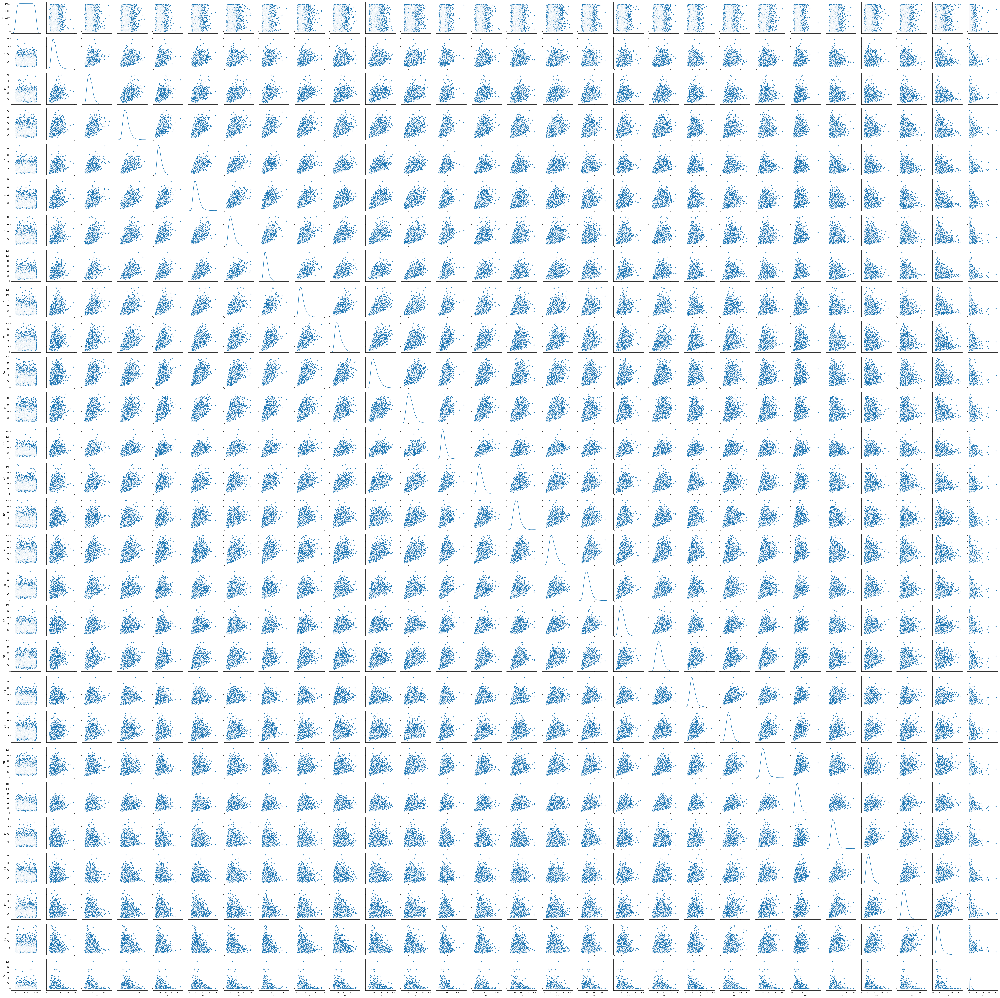

In [139]:
sns.pairplot(data, diag_kind='kde')


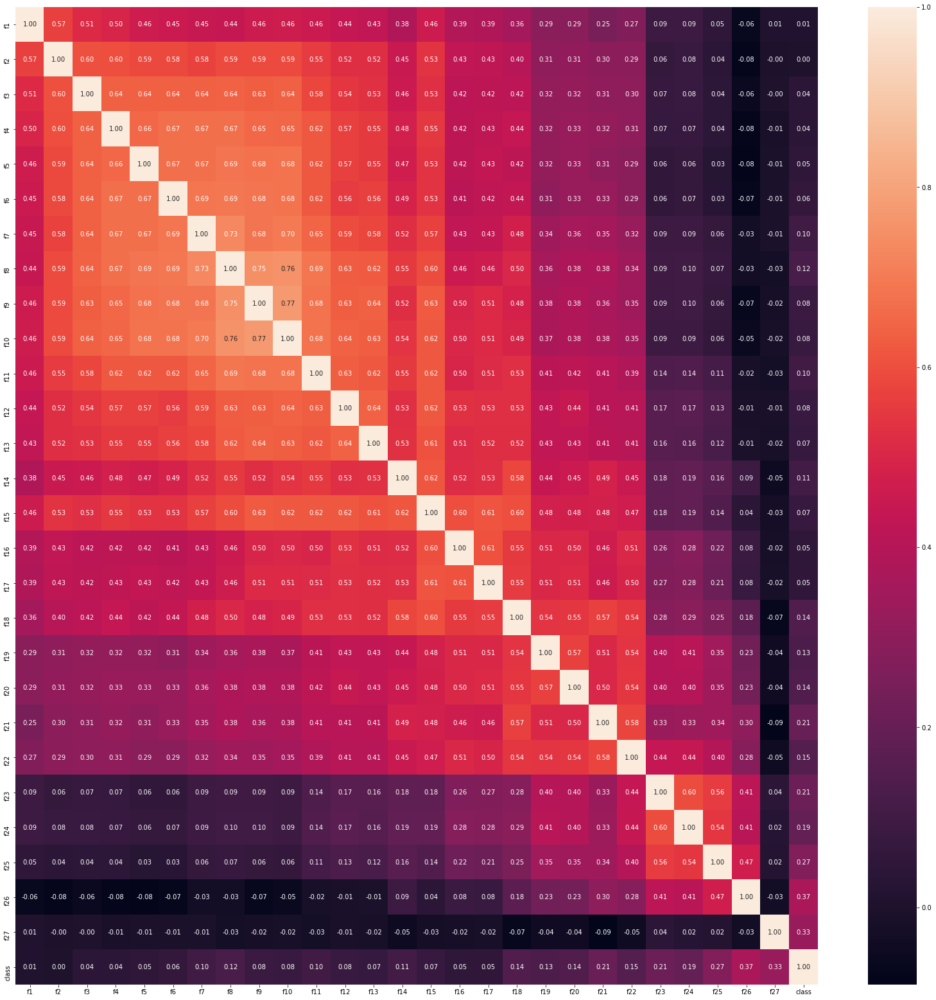

In [71]:
plt.figure(figsize=(28,28))
sns.heatmap(data.corr(), annot=True, fmt=".2f")

plt.show()

/home/zhaoxiangc/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


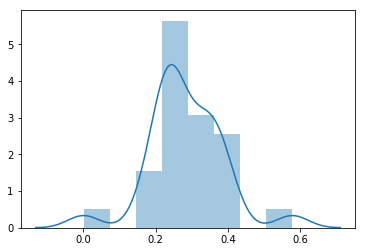

In [88]:
sns.distplot(X_minmax_transform[26])

## RFE selection

### RFE using XGB

In [ ]:
clf_rf_4 = XGBClassifier()
rfecv = RFECV(estimator=clf_rf_4, step=1, cv=10,scoring='roc_auc', n_jobs=-1)   #5-fold cross-validation
rfecv = rfecv.fit(X, y)

print('Optimal number of features :', rfecv.n_features_)
print('Best features :', X.columns[rfecv.support_])

### RFE using LGBM

### RFE using Cat

In [30]:
class CatBoostClassifierSklearnWrapper(CatBoostClassifier):
    def __getattr__(self, attr):
        if attr == 'coef_':
            return np.array(self.feature_importances_)
        else:
            return object.__getattribute__(self, attr)
        
clf_rf_4 = CatBoostClassifierSklearnWrapper(eval_metric="AUC", logging_level="Silent")
rfecv = RFECV(estimator=clf_rf_4, step=1, cv=5,scoring='roc_auc', n_jobs=-1)   #5-fold cross-validation
rfecv = rfecv.fit(X, y)

print('Optimal number of features :', rfecv.n_features_)
print('Best features :', X.columns[rfecv.support_])

Optimal number of features : 27
Best features : Index(['f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11',
       'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20', 'f21',
       'f22', 'f23', 'f24', 'f25', 'f26', 'f27'],
      dtype='object')


In [22]:
params = {'objective': 'binary',
          'bagging_fraction': 0.6, 
          'bagging_freq': 1, 
          'feature_fraction': 0.75, 
          'learning_rate': 0.02, 
          'max_bin': 300, 
          'max_depth': -1, 
          'min_data_in_leaf': 80, 
          'num_iterations': 400, 
          'num_leaves': 20}
clf_rf_4 = LGBMClassifier(**params)
rfecv = RFECV(estimator=clf_rf_4, step=1, cv=10,scoring='roc_auc', n_jobs=-1)   #5-fold cross-validation
rfecv = rfecv.fit(X, y)
print('Optimal number of features :', rfecv.n_features_)
print('Best features :', X.columns[rfecv.support_])

Optimal number of features : 25
Best features : Index(['f1', 'f2', 'f3', 'f4', 'f5', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12',
       'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f21', 'f22', 'f23',
       'f24', 'f25', 'f26', 'f27'],
      dtype='object')


**Feature selection results**

In [12]:
lgbm_features = ['f1', 'f2', 'f3', 'f4', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13',
       'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20', 'f21', 'f23', 'f24',
       'f25', 'f26', 'f27']
lgbm_features2 = ['f1', 'f2', 'f3', 'f4', 'f5', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12',
       'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f21', 'f22', 'f23',
       'f24', 'f25', 'f26', 'f27']
xgb_features = ['f1', 'f2', 'f7', 'f8', 'f11', 'f12', 'f13', 'f15', 'f16', 'f17', 'f18',
       'f19', 'f21', 'f23', 'f24', 'f25', 'f26', 'f27']
X_selected = X[X.columns.intersection(lgbm_features)]
X_selected_lgbm2 = X[X.columns.intersection(lgbm_features2)]
X_selected_xgb = X[X.columns.intersection(xgb_features)]

## mlxtend feature selection

### SBS using LGBM

In [72]:
from collections import defaultdict as dd

In [141]:
lightgbm_selected_params = {'objective': 'binary','bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.8, 
                            'learning_rate': 0.02, 'max_bin': 300, 'max_depth': -1, 'min_data_in_leaf': 80, 
                            'num_iterations': 400, 'num_leaves': 15}
lgbm = LGBMClassifier(n_jobs=1, **lightgbm_selected_params)
lgbm_raw = LGBMClassifier(n_jobs=1, objective='binary')
features_comb = dd(int)
features = dd(int)

In [143]:
sfs1 = SFS(estimator=lgbm_raw, 
           k_features=(18, 27),
           forward=False, 
           floating=False, 
           scoring='roc_auc',
           cv=scv_10, n_jobs=-1, verbose=1)

sfs1.fit(X.as_matrix(), y)
features_comb[sfs1.k_feature_idx_] += 1
res = list()
for item in sfs1.k_feature_idx_:
    res.append('f'+str(item+1))
    features['f'+str(item+1)] += 1

print(sfs1.k_score_, res)
print(len(res))

[Parallel(n_jobs=-1)]: Done  24 out of  27 | elapsed:   19.2s remaining:    2.4s
[Parallel(n_jobs=-1)]: Done  27 out of  27 | elapsed:   19.3s finished
Features: 26/18[Parallel(n_jobs=-1)]: Done  22 out of  26 | elapsed:   17.6s remaining:    3.2s
[Parallel(n_jobs=-1)]: Done  26 out of  26 | elapsed:   19.8s finished
Features: 25/18[Parallel(n_jobs=-1)]: Done  20 out of  25 | elapsed:   16.5s remaining:    4.1s
[Parallel(n_jobs=-1)]: Done  25 out of  25 | elapsed:   18.4s finished
Features: 24/18[Parallel(n_jobs=-1)]: Done  18 out of  24 | elapsed:   15.6s remaining:    5.2s
[Parallel(n_jobs=-1)]: Done  24 out of  24 | elapsed:   15.8s finished
Features: 23/18[Parallel(n_jobs=-1)]: Done  16 out of  23 | elapsed:    9.4s remaining:    4.1s
[Parallel(n_jobs=-1)]: Done  23 out of  23 | elapsed:   14.9s finished
Features: 22/18[Parallel(n_jobs=-1)]: Done  14 out of  22 | elapsed:    9.2s remaining:    5.2s
[Parallel(n_jobs=-1)]: Done  22 out of  22 | elapsed:   14.8s finished
Features: 21/

0.9289282414795886 ['f1', 'f2', 'f4', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f14', 'f16', 'f17', 'f18', 'f19', 'f21', 'f22', 'f24', 'f25', 'f26', 'f27']
20


In [ ]:
for i in range(0, 20):
    sfs1 = SFS(estimator=lgbm, 
               k_features=(20, 27),
               forward=False, 
               floating=False, 
               scoring='roc_auc',
               cv=scv_5, n_jobs=-1, verbose=0)

    sfs1.fit(X.as_matrix(), y)
    features_comb[sfs1.k_feature_idx_] += 1
    res = list()
    for item in sfs1.k_feature_idx_:
        res.append('f'+str(item+1))
        features['f'+str(item+1)] += 1

    print(sfs1.k_score_, res)
    print(len(res))
#print('all subsets:\n', sfs1.subsets_)
# best combination (AUC: 0.93315332): (0, 1, 2, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 20, 21, 23, 24, 25, 26)
# best combination (AUC: 0.93309325): (1, 2, 5, 6, 7, 9, 10, 11, 12, 15, 16, 17, 18, 20, 21, 23, 24, 25, 26)
# best combination (AUC: 0.93305470): (1, 2, 3, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 20, 21, 23, 24, 25, 26)
# best combination (AUC: 0.93284653): (0, 1, 2, 3, 4, 6, 7, 9, 10, 12, 14, 15, 16, 17, 18, 20, 23, 24, 25, 26)
# 0.9328373293353047 ['f2', 'f3', 'f7', 'f8', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27']
# 0.9329954579008181 ['f1', 'f2', 'f3', 'f5', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f16', 'f17', 'f18', 'f21', 'f22', 'f24', 'f25', 'f26', 'f27']
# 0.9334109398511389 ['f1', 'f2', 'f3', 'f6', 'f7', 'f8', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20', 'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27']
# [('f2', 20), ('f7', 20), ('f8', 20), ('f10', 20), ('f11', 20), ('f16', 20), ('f17', 20), ('f18', 20), ('f19', 20), ('f21', 20), ('f24', 20), ('f25', 20), ('f26', 20), ('f27', 20), ('f12', 19), ('f13', 19), ('f4', 18), ('f3', 17), ('f14', 17), ('f22', 16), ('f5', 15), ('f9', 15), ('f6', 14), ('f23', 14), ('f1', 14), ('f15', 13), ('f20', 13)]

0.9330350105337194 ['f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20', 'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27']
25
0.9331477795656733 ['f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f10', 'f11', 'f12', 'f13', 'f14', 'f16', 'f17', 'f18', 'f19', 'f21', 'f22', 'f24', 'f25', 'f26', 'f27']
23
0.9328044378161163 ['f2', 'f3', 'f4', 'f7', 'f8', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20', 'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27']
23
0.9330209586000551 ['f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f16', 'f17', 'f18', 'f19', 'f21', 'f24', 'f25', 'f26', 'f27']
23
0.9320124715169298 ['f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20', 'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27']
27
0.9322353243040699 ['f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f

In [83]:
print(sorted(features.items(),key= lambda x:x[1], reverse=True))

[('f2', 20), ('f7', 20), ('f8', 20), ('f10', 20), ('f11', 20), ('f16', 20), ('f17', 20), ('f18', 20), ('f19', 20), ('f21', 20), ('f24', 20), ('f25', 20), ('f26', 20), ('f27', 20), ('f12', 19), ('f13', 19), ('f4', 18), ('f3', 17), ('f14', 17), ('f22', 16), ('f5', 15), ('f9', 15), ('f6', 14), ('f23', 14), ('f1', 14), ('f15', 13), ('f20', 13)]


In [66]:
res = []
for item in sfs1.k_feature_idx_:
    res.append('f'+str(item+1))
print(sfs1.k_score_, res)
print(len(res))

0.9329954579008181 ['f1', 'f2', 'f3', 'f5', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f16', 'f17', 'f18', 'f21', 'f22', 'f24', 'f25', 'f26', 'f27']
21


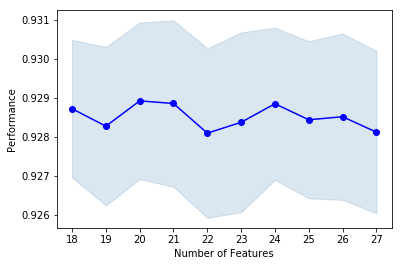

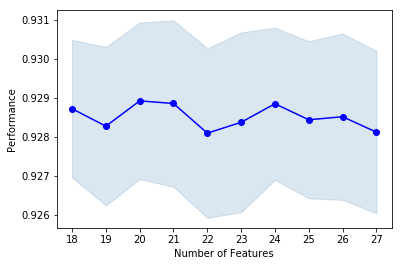

In [144]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
plot_sfs(sfs1.get_metric_dict(), kind='std_err')

In [8]:
# no 5, 6, 23, 1, 15, 20
# lgbm_features_sbs = ['f2', 'f3', 'f4,', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13',
#        'f14', 'f16', 'f17', 'f18', 'f19', 'f21', 'f22', 'f24', 'f25', 'f26', 'f27']
# lgbm_features_sbs = ['f1', 'f2', 'f3', 'f6', 'f7', 'f8', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 
#  'f17', 'f18', 'f19', 'f20', 'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27']
# lgbm_features_sbs = ['f2', 'f3', 'f4', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13',
#                      'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f21', 'f23', 'f24', 'f25', 'f26', 'f27']
# previous best
lgbm_features_sbs =['f2', 'f3', 'f4', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13',
 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f21', 'f23', 'f24', 'f25', 'f26', 'f27']
# next candidate
# lgbm_features_sbs =['f2', 'f3', 'f4', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13',
#  'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f21', 'f23', 'f24', 'f25', 'f26', 'f27']

X_selected_sbs = X[X.columns.intersection(lgbm_features_sbs)]


### SBS using Cat

In [130]:
cat_sbs = CatBoostClassifier(eval_metric="AUC", logging_level='Silent')

sfs1 = SFS(estimator=cat_sbs, 
           k_features=24,
           forward=False, 
           floating=False, 
           scoring='roc_auc',
           cv=scv_3, n_jobs=-1, verbose=3)

sfs1.fit(X.as_matrix(), y)
res = list()
for item in sfs1.k_feature_idx_:
    res.append('f'+str(item+1))
print(sfs1.k_score_, res)
print(len(res))

0 ['f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20', 'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27']
27



STOPPING EARLY DUE TO KEYBOARD INTERRUPT...

### SBS using XGB

[Parallel(n_jobs=-1)]: Done  10 out of  27 | elapsed:    6.8s remaining:   11.5s
[Parallel(n_jobs=-1)]: Done  24 out of  27 | elapsed:   13.3s remaining:    1.7s
[Parallel(n_jobs=-1)]: Done  27 out of  27 | elapsed:   13.4s finished

[2018-07-01 11:15:26] Features: 26/20 -- score: 0.8984469657013546[Parallel(n_jobs=-1)]: Done   9 out of  26 | elapsed:    7.5s remaining:   14.1s
[Parallel(n_jobs=-1)]: Done  23 out of  26 | elapsed:   13.8s remaining:    1.8s
[Parallel(n_jobs=-1)]: Done  26 out of  26 | elapsed:   13.9s finished

[2018-07-01 11:15:40] Features: 25/20 -- score: 0.8984469657013546[Parallel(n_jobs=-1)]: Done   7 out of  25 | elapsed:    7.2s remaining:   18.4s
[Parallel(n_jobs=-1)]: Done  20 out of  25 | elapsed:   11.6s remaining:    2.9s
[Parallel(n_jobs=-1)]: Done  25 out of  25 | elapsed:   13.3s finished

[2018-07-01 11:15:54] Features: 24/20 -- score: 0.8984469657013546[Parallel(n_jobs=-1)]: Done   6 out of  24 | elapsed:    6.9s remaining:   20.8s
[Parallel(n_jobs=-1

best combination (AUC: 0.89844697): (0, 1, 2, 3, 4, 5, 6, 7, 8, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26)



[Parallel(n_jobs=-1)]: Done  21 out of  21 | elapsed:    9.8s finished

[2018-07-01 11:16:38] Features: 20/20 -- score: 0.8984296296071774

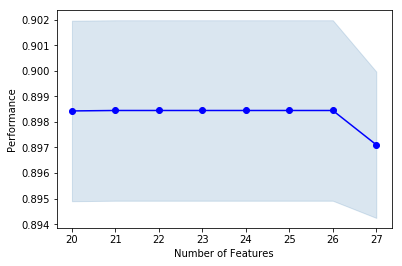

In [45]:
param = {'n_jobs':1, 'eval_metric':"auc", 'bagging_temperature': 0.5, 'border_count': 130, 'depth': 10, 
                       'iterations': 2200, 'l2_leaf_reg': 15, 'learning_rate': 0.007, 'logging_level':"Silent"}
xgb = XGBClassifier(**param)
sfs1 = SFS(estimator=xgb, 
           k_features=(20, 25),
           forward=False, 
           floating=False, 
           scoring='roc_auc',
           cv=scv_5, n_jobs=-1, verbose=2)

sfs1.fit(X.as_matrix(), y)

print('best combination (AUC: %.8f): %s\n' % (sfs1.k_score_, sfs1.k_feature_idx_))
#print('all subsets:\n', sfs1.subsets_)
plot_sfs(sfs1.get_metric_dict(), kind='std_err');

### SBS using random forest

In [ ]:
rfe_params = {'bootstrap': True, 'max_features': 5, 'min_samples_leaf': 5, 'min_samples_split': 2, 'n_estimators': 4000}
rfe = RandomForestClassifier(n_jobs=-1, criterion='entropy', **rfe_params)
sfs1 = SFS(estimator=rfe, 
           k_features=(20, 25),
           forward=False, 
           floating=False, 
           scoring='roc_auc',
           cv=5, n_jobs=-1)

sfs1.fit(X.as_matrix(), y)

print('best combination (AUC: %.8f): %s\n' % (sfs1.k_score_, sfs1.k_feature_idx_))
#print('all subsets:\n', sfs1.subsets_)
plot_sfs(sfs1.get_metric_dict(), kind='std_err');

## Feature Final

In [6]:
# no 5, 6, 23, 1, 15, 20
# lgbm_features_sbs = ['f2', 'f3', 'f4,', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13',
#        'f14', 'f16', 'f17', 'f18', 'f19', 'f21', 'f22', 'f24', 'f25', 'f26', 'f27']
# lgbm_features_sbs = ['f1', 'f2', 'f3', 'f6', 'f7', 'f8', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 
#  'f17', 'f18', 'f19', 'f20', 'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27']
# lgbm_features_sbs = ['f2', 'f3', 'f4', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13',
#                      'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f21', 'f23', 'f24', 'f25', 'f26', 'f27']
# previous best
lgbm_features_sbs =['f2', 'f3', 'f4', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13',
 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f21', 'f23', 'f24', 'f25', 'f26', 'f27']
# next candidate
# lgbm_features_sbs =['f2', 'f3', 'f4', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13',
#  'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f21', 'f23', 'f24', 'f25', 'f26', 'f27']

X_selected_sbs = X[X.columns.intersection(lgbm_features_sbs)]

# XGBoost

## Experiments

### With Selected Features

In [51]:
bst = XGBClassifier(n_jobs=1)
# cross_val_score(bst, X_minmax_transform, y, cv=10, scoring='roc_auc').mean()
parameters = {'learning_rate':[0.1],
              'n_estimators': [150, 170, 200, 250], 
              'max_depth': [3, 4, 5], 
              'min_child_weight':[2, 4, 6],
              'gamma':[0.6, 0.9],
              'subsample':[0.9],
              'colsample_bytree':[0.9],
              'reg_alpha':[1, 3]
             }
clf = GridSearchCV(bst, parameters, cv=scv_5, n_jobs=16, scoring='roc_auc', return_train_score=True, verbose=1)
clf.fit(X_selected_sbs, y)
print(clf.best_score_)
print(clf.best_params_)
# 0.931013278584638
# {'colsample_bytree': 0.9, 'gamma': 0.6, 'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 150, 'reg_alpha': 3, 'subsample': 0.9}
# 0.9310008299209329
# {'colsample_bytree': 0.9, 'gamma': 0.9, 'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 170, 'reg_alpha': 3, 'subsample': 0.9}

Fitting 5 folds for each of 144 candidates, totalling 720 fits


[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    3.2s
[Parallel(n_jobs=16)]: Done 168 tasks      | elapsed:   28.5s
[Parallel(n_jobs=16)]: Done 418 tasks      | elapsed:  1.4min
[Parallel(n_jobs=16)]: Done 720 out of 720 | elapsed:  2.5min finished


0.9310008299209329
{'colsample_bytree': 0.9, 'gamma': 0.9, 'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 170, 'reg_alpha': 3, 'subsample': 0.9}


#### Feature interaction analysis

In [100]:
xgbfir.saveXgbFI(clf.best_estimator_, feature_names=X_selected_xgb.columns, OutputXlsxFile='xgbFI.xlsx')

In [103]:
xgb_features_interaction = X_selected_xgb.copy()
xgb_features_interaction['f28'] = xgb_features_interaction.apply(lambda row: row['f27']*row['f27'],axis=1)
xgb_features_interaction['f29'] = xgb_features_interaction.apply(lambda row: row['f26']*row['f8'],axis=1)
xgb_features_interaction['f30'] = xgb_features_interaction.apply(lambda row: row['f26']*row['f27'],axis=1)

xgb_features_interaction.head()

,f1,f2,f7,f8,f11,f12,f13,f15,f16,f17,...,f19,f21,f23,f24,f25,f26,f27,f28,f29,f30
0,9.07,12.33,28.03,34.39,34.75,35.08,36.89,43.57,35.42,29.54,...,24.86,25.36,8.28,5.68,8.92,4.56,0.73,0.5329,156.8184,3.3288
1,15.42,19.47,36.02,25.42,42.02,40.32,45.73,49.65,24.71,32.32,...,21.60,30.28,14.40,8.45,11.27,8.17,0.30,0.0900,207.6814,2.4510
2,14.25,17.55,34.37,28.11,52.70,35.56,34.77,35.75,32.19,26.62,...,27.67,46.71,13.13,16.13,15.86,8.85,0.29,0.0841,248.7735,2.5665
3,8.41,13.40,12.90,21.42,33.15,25.64,21.40,26.90,15.68,30.43,...,21.96,25.94,16.76,11.19,10.19,5.37,0.52,0.2704,115.0254,2.7924
4,9.45,8.08,15.33,19.98,21.97,28.08,22.70,23.07,21.44,18.06,...,33.22,33.96,10.09,9.05,11.75,4.42,0.28,0.0784,88.3116,1.2376


In [105]:
bst = XGBClassifier(n_jobs=-1)
# cross_val_score(bst, X_minmax_transform, y, cv=10, scoring='roc_auc').mean()
parameters = {'learning_rate':[0.1],
              'n_estimators': [110, 120, 130], 
              'max_depth': [3, 4, 5], 
              'min_child_weight':[4, 6],
              'gamma':[0.3, 0.6],
              'subsample':[0.5, 0.9],
              'colsample_bytree':[0.5, 0.9],
              'reg_alpha':[0, 3]
             }
clf = GridSearchCV(bst, parameters, n_jobs=8, scoring='roc_auc', return_train_score=True, verbose=1)
clf.fit(xgb_features_interaction, y)
print(clf.best_score_)
print(clf.best_params_)


Fitting 3 folds for each of 288 candidates, totalling 864 fits


[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:   17.5s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:  1.8min
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:  4.4min
[Parallel(n_jobs=8)]: Done 784 tasks      | elapsed:  8.5min
[Parallel(n_jobs=8)]: Done 864 out of 864 | elapsed:  9.7min finished


0.9297941964907709
{'colsample_bytree': 0.5, 'gamma': 0.3, 'learning_rate': 0.1, 'max_depth': 5, 'min_child_weight': 4, 'n_estimators': 120, 'reg_alpha': 3, 'subsample': 0.9}


### with all features

In [ ]:
cat = CatBoostClassifier(eval_metric="AUC", iterations=1500, logging_level="Silent")
# cross_val_score(bst, X_minmax_transform, y, cv=10, scoring='roc_auc').mean()
parameters = {'depth': [6, 7, 8, 9, 10], 'learning_rate': [0.007, 0.01, 0.012]}
clf = GridSearchCV(cat, parameters, scoring='roc_auc', return_train_score=True, n_jobs=4)
clf.fit(X, y)
print(clf.best_score_)
print(clf.best_params_)

# clf.best_params_
# Out[14]: {'depth': 4}
# clf.best_score_
# Out[15]: 0.9294006522488342

## Test

In [22]:
parameters = {'colsample_bytree': 0.9, 'gamma': 0.6, 'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 150, 'reg_alpha': 3, 'subsample': 0.9}
model = XGBClassifier(n_jobs=-1, **parameters)
model.fit(X_selected, y)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.9, gamma=0.6, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=6, missing=None,
       n_estimators=150, n_jobs=-1, nthread=None,
       objective='binary:logistic', random_state=0, reg_alpha=3,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
       subsample=0.9)

In [23]:
try:
    data = pd.read_csv("./data/testdata_nolabels.csv")
    print("Dataset has {} samples with {} features each.".format(*data.shape))
except:
    print("Dataset could not be loaded. Is the dataset missing?")
X_test = data.drop(['ID'], axis = 1, inplace=False)
X_test_minmax_transform = scaler.transform(X_test)
X_test_std_transform = scaler_std.transform(X_test)
X_test_rbs_transform = scaler_rbs.fit_transform(X_test)
X_test_new_raw = model_select_raw.transform(X_test)
X_test_new = model_select.transform(X_test_rbs_transform)
X_test_selected = X_test[X_test.columns.intersection(xgb_features)]

Dataset has 4000 samples with 28 features each.


In [24]:
y_prob = model.predict_proba(X_test_selected)

#%%
result = pd.DataFrame()
result['score'] = y_prob[:, 1]
result.index += 1
result.to_csv('./results/out_xgb_xgbselect.csv', index_label='Id')

# CatBoost

## with selected features

We use lightGBM selected features in this case.

In [122]:
cat = CatBoostClassifier(eval_metric="AUC", logging_level="Silent")
parameters = {'thread_count' : [2],
              'depth': [10], 
              'learning_rate': [0.007],
              'iterations':[2200],
              'l2_leaf_reg':[20],
              'border_count':[130],
              'bagging_temperature':[0.65, 0.7]
             }
clf = GridSearchCV(cat, parameters, cv=scv_10, scoring='roc_auc', return_train_score=True, n_jobs=-1, verbose=1)
clf.fit(X_selected_sbs, y)
print(clf.best_score_)
print(clf.best_params_)

# 0.932499243183506
# {'bagging_temperature': 0.7, 'border_count': 130, 'depth': 10, 'iterations': 2200, 'l2_leaf_reg': 20, 'learning_rate': 0.007}
# 0.9326508613938976
# {'bagging_temperature': 0.65, 'border_count': 130, 'depth': 10, 'iterations': 2200, 'l2_leaf_reg': 20, 'learning_rate': 0.007, 'od_pval': 0.0001, 'thread_count': 1}
# 0.9328049237814725
# {'bagging_temperature': 0.65, 'border_count': 130, 'depth': 10, 'iterations': 2200, 'l2_leaf_reg': 20, 'learning_rate': 0.007, 'od_pval': 1e-05, 'random_strength': 5, 'thread_count': 1}
# 0.9331132528973873
# {'bagging_temperature': 0.65, 'border_count': 130, 'depth': 10, 'iterations': 2200, 'l2_leaf_reg': 20, 'learning_rate': 0.007, 'od_pval': 1e-05, 'thread_count': 2}
# 0.9330077024007086
# {'bagging_temperature': 0.65, 'border_count': 130, 'depth': 10, 'iterations': 2200, 'l2_leaf_reg': 20, 'learning_rate': 0.007, 'od_pval': 0, 'thread_count': 2}

Fitting 10 folds for each of 4 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Done  34 out of  40 | elapsed: 28.1min remaining:  5.0min
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed: 28.1min finished


0.9330077024007086
{'bagging_temperature': 0.65, 'border_count': 130, 'depth': 10, 'iterations': 2200, 'l2_leaf_reg': 20, 'learning_rate': 0.007, 'od_pval': 0, 'thread_count': 2}


In [98]:
print(clf.best_score_)
print(clf.best_params_)
print(clf.grid_scores_)

0.9335083171168421
{'bagging_temperature': 0.65, 'border_count': 130, 'depth': 10, 'iterations': 2200, 'l2_leaf_reg': 20, 'learning_rate': 0.007, 'od_pval': 1e-05, 'random_strength': 5, 'thread_count': 2}
[mean: 0.93132, std: 0.00589, params: {'bagging_temperature': 0.65, 'border_count': 130, 'depth': 10, 'iterations': 2200, 'l2_leaf_reg': 20, 'learning_rate': 0.007, 'od_pval': 0, 'random_strength': 0, 'thread_count': 2}, mean: 0.93316, std: 0.00588, params: {'bagging_temperature': 0.65, 'border_count': 130, 'depth': 10, 'iterations': 2200, 'l2_leaf_reg': 20, 'learning_rate': 0.007, 'od_pval': 0, 'random_strength': 5, 'thread_count': 2}, mean: 0.93148, std: 0.00615, params: {'bagging_temperature': 0.65, 'border_count': 130, 'depth': 10, 'iterations': 2200, 'l2_leaf_reg': 20, 'learning_rate': 0.007, 'od_pval': 1e-05, 'random_strength': 0, 'thread_count': 2}, mean: 0.93351, std: 0.00628, params: {'bagging_temperature': 0.65, 'border_count': 130, 'depth': 10, 'iterations': 2200, 'l2_leaf_

## feature exploration

In [42]:
def plot_feature_importances(clf, X_train, y_train=None, 
                             top_n=10, figsize=(8,8), print_table=False, title="Feature Importances"):
    '''
    plot feature importances of a tree-based sklearn estimator
    
    Note: X_train and y_train are pandas DataFrames
    
    Note: Scikit-plot is a lovely package but I sometimes have issues
              1. flexibility/extendibility
              2. complicated models/datasets
          But for many situations Scikit-plot is the way to go
          see https://scikit-plot.readthedocs.io/en/latest/Quickstart.html
    
    Parameters
    ----------
        clf         (sklearn estimator) if not fitted, this routine will fit it
        
        X_train     (pandas DataFrame)
        
        y_train     (pandas DataFrame)  optional
                                        required only if clf has not already been fitted 
        
        top_n       (int)               Plot the top_n most-important features
                                        Default: 10
                                        
        figsize     ((int,int))         The physical size of the plot
                                        Default: (8,8)
        
        print_table (boolean)           If True, print out the table of feature importances
                                        Default: False
        
    Returns
    -------
        the pandas dataframe with the features and their importance
        
    Author
    ------
        George Fisher
    '''
    
    __name__ = "plot_feature_importances"
    
    import pandas as pd
    import numpy  as np
    import matplotlib.pyplot as plt
    
    from xgboost.core     import XGBoostError
    from lightgbm.sklearn import LightGBMError
    
    try: 
        if not hasattr(clf, 'feature_importances_'):
            clf.fit(X_train.values, y_train.values.ravel())

            if not hasattr(clf, 'feature_importances_'):
                raise AttributeError("{} does not have feature_importances_ attribute".
                                    format(clf.__class__.__name__))
                
    except (XGBoostError, LightGBMError, ValueError):
        clf.fit(X_train.values, y_train.values.ravel())
            
    feat_imp = pd.DataFrame({'importance':clf.feature_importances_})    
    feat_imp['feature'] = X_train.columns
    feat_imp.sort_values(by='importance', ascending=False, inplace=True)
    feat_imp = feat_imp.iloc[:top_n]
    
    feat_imp.sort_values(by='importance', inplace=True)
    feat_imp = feat_imp.set_index('feature', drop=True)
    feat_imp.plot.barh(title=title, figsize=figsize)
    plt.xlabel('Feature Importance Score')
    plt.show()
    
    if print_table:
        from IPython.display import display
        print("Top {} features in descending order of importance".format(top_n))
        display(feat_imp.sort_values(by='importance', ascending=False))
        
    return feat_imp

In [50]:
cat = CatBoostClassifier(eval_metric="AUC", logging_level="Silent")
cat.fit(X_selected, y)

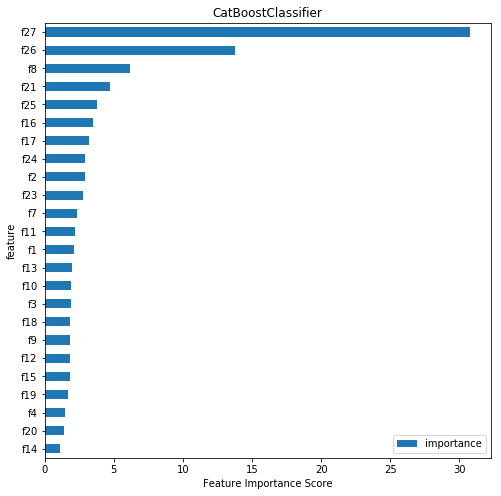

,importance
feature,
f14,1.112491
f20,1.435927
f4,1.473969
f19,1.682920
f15,1.820854
f12,1.830640
f9,1.831937
f18,1.849119
f3,1.889172


In [51]:
plot_feature_importances(cat, X_selected, y, top_n=X.shape[1], title=cat.__class__.__name__)

## with all features

### raw data

In [6]:
cat = CatBoostClassifier(eval_metric="AUC", logging_level="Silent")
parameters = {'depth': [9, 10], 
              'learning_rate': [0.007],
              'iterations':[1500, 2200],
              'l2_leaf_reg':[10,15,20,25],
              'border_count':[50, 60, 70],
             }
clf = GridSearchCV(cat, parameters, scoring='roc_auc', return_train_score=True, n_jobs=4, verbose=3)
clf.fit(X, y)
print(clf.best_score_)
print(clf.best_params_)

# 0.9316689155232291
# {'border_count': 32, 'depth': 7, 'iterations': 1500, 'l2_leaf_reg': 10, 'learning_rate': 0.01}
# 0.931742127912833
# {'border_count': 50, 'depth': 10, 'iterations': 2200, 'l2_leaf_reg': 15, 'learning_rate': 0.007}

Fitting 3 folds for each of 48 candidates, totalling 144 fits
[CV] border_count=50, depth=9, iterations=1500, l2_leaf_reg=10, learning_rate=0.007 
[CV] border_count=50, depth=9, iterations=1500, l2_leaf_reg=10, learning_rate=0.007 
[CV] border_count=50, depth=9, iterations=1500, l2_leaf_reg=10, learning_rate=0.007 
[CV] border_count=50, depth=9, iterations=1500, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=50, depth=9, iterations=1500, l2_leaf_reg=10, learning_rate=0.007, score=0.9343944057864808, total= 2.3min
[CV] border_count=50, depth=9, iterations=1500, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=50, depth=9, iterations=1500, l2_leaf_reg=15, learning_rate=0.007, score=0.9338949528496115, total= 2.4min
[CV] border_count=50, depth=9, iterations=1500, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=50, depth=9, iterations=1500, l2_leaf_reg=10, learning_rate=0.007, score=0.9334972515294906, total= 2.4min
[CV] border_count=50, depth=9, iterations=1500, l2

[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed: 17.5min


[CV]  border_count=50, depth=10, iterations=1500, l2_leaf_reg=10, learning_rate=0.007, score=0.9341210857077284, total= 3.8min
[CV] border_count=50, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=50, depth=10, iterations=1500, l2_leaf_reg=10, learning_rate=0.007, score=0.9241937879309531, total= 4.0min
[CV] border_count=50, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=50, depth=10, iterations=1500, l2_leaf_reg=10, learning_rate=0.007, score=0.934609974824013, total= 4.0min
[CV] border_count=50, depth=10, iterations=1500, l2_leaf_reg=20, learning_rate=0.007 
[CV]  border_count=50, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007, score=0.9341902756120775, total= 4.0min
[CV] border_count=50, depth=10, iterations=1500, l2_leaf_reg=20, learning_rate=0.007 
[CV]  border_count=50, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007, score=0.9244806961405782, total= 3.6min
[CV] border_count=50, 

[CV]  border_count=60, depth=9, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9343393432921793, total= 3.4min
[CV] border_count=60, depth=9, iterations=2200, l2_leaf_reg=20, learning_rate=0.007 
[CV]  border_count=60, depth=9, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9249853170504486, total= 3.2min
[CV] border_count=60, depth=9, iterations=2200, l2_leaf_reg=20, learning_rate=0.007 
[CV]  border_count=60, depth=9, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.934432116296963, total= 3.3min
[CV] border_count=60, depth=9, iterations=2200, l2_leaf_reg=25, learning_rate=0.007 
[CV]  border_count=60, depth=9, iterations=2200, l2_leaf_reg=20, learning_rate=0.007, score=0.9350931194859021, total= 3.3min
[CV] border_count=60, depth=9, iterations=2200, l2_leaf_reg=25, learning_rate=0.007 
[CV]  border_count=60, depth=9, iterations=2200, l2_leaf_reg=20, learning_rate=0.007, score=0.9242663588310347, total= 3.3min
[CV] border_count=60, depth=9, 

[CV]  border_count=70, depth=9, iterations=1500, l2_leaf_reg=20, learning_rate=0.007, score=0.9336997585666101, total= 2.3min
[CV] border_count=70, depth=9, iterations=1500, l2_leaf_reg=25, learning_rate=0.007 
[CV]  border_count=70, depth=9, iterations=1500, l2_leaf_reg=20, learning_rate=0.007, score=0.9234782051022405, total= 2.4min
[CV] border_count=70, depth=9, iterations=1500, l2_leaf_reg=25, learning_rate=0.007 
[CV]  border_count=70, depth=9, iterations=1500, l2_leaf_reg=20, learning_rate=0.007, score=0.9343730177357598, total= 2.3min
[CV] border_count=70, depth=9, iterations=2200, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=70, depth=9, iterations=1500, l2_leaf_reg=25, learning_rate=0.007, score=0.9346149778704811, total= 2.3min
[CV] border_count=70, depth=9, iterations=2200, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=70, depth=9, iterations=1500, l2_leaf_reg=25, learning_rate=0.007, score=0.9234331998928876, total= 2.3min
[CV] border_count=70, depth=9,

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed: 105.7min


[CV]  border_count=70, depth=10, iterations=1500, l2_leaf_reg=10, learning_rate=0.007, score=0.9346841677748301, total= 3.2min
[CV] border_count=70, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=70, depth=10, iterations=1500, l2_leaf_reg=10, learning_rate=0.007, score=0.9240548343470757, total= 3.2min
[CV] border_count=70, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=70, depth=10, iterations=1500, l2_leaf_reg=10, learning_rate=0.007, score=0.9351773210115648, total= 3.3min
[CV] border_count=70, depth=10, iterations=1500, l2_leaf_reg=20, learning_rate=0.007 
[CV]  border_count=70, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007, score=0.934491223570019, total= 3.4min
[CV] border_count=70, depth=10, iterations=1500, l2_leaf_reg=20, learning_rate=0.007 
[CV]  border_count=70, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007, score=0.9239063171562109, total= 3.4min
[CV] border_count=70, 

[Parallel(n_jobs=4)]: Done 144 out of 144 | elapsed: 132.0min finished


0.931742127912833
{'border_count': 50, 'depth': 10, 'iterations': 2200, 'l2_leaf_reg': 10, 'learning_rate': 0.007}


### scaled data

In [5]:
cat = CatBoostClassifier(eval_metric="AUC", logging_level="Silent")
# cross_val_score(bst, X_minmax_transform, y, cv=10, scoring='roc_auc').mean()
parameters = {'depth': [8, 9, 10, 12], 
              'learning_rate': [0.007, 0.01],
              'iterations':[1500, 2200],
              'l2_leaf_reg':[5, 10,15],
              'border_count':[40, 60, 80],
             }
clf = GridSearchCV(cat, parameters, scoring='roc_auc', return_train_score=True, n_jobs=4, verbose=3)
clf.fit(X_new, y)
print(clf.best_score_)
print(clf.best_params_)

# 0.9313192631767578
# {'border_count': 60, 'depth': 8, 'iterations': 1500, 'l2_leaf_reg': 15, 'learning_rate': 0.01}

Fitting 3 folds for each of 144 candidates, totalling 432 fits
[CV] border_count=40, depth=8, iterations=1500, l2_leaf_reg=5, learning_rate=0.007 
[CV] border_count=40, depth=8, iterations=1500, l2_leaf_reg=5, learning_rate=0.007 
[CV] border_count=40, depth=8, iterations=1500, l2_leaf_reg=5, learning_rate=0.007 
[CV] border_count=40, depth=8, iterations=1500, l2_leaf_reg=5, learning_rate=0.01 
[CV]  border_count=40, depth=8, iterations=1500, l2_leaf_reg=5, learning_rate=0.01, score=0.9350897443686168, total= 1.4min
[CV] border_count=40, depth=8, iterations=1500, l2_leaf_reg=5, learning_rate=0.01 
[CV]  border_count=40, depth=8, iterations=1500, l2_leaf_reg=5, learning_rate=0.007, score=0.9343792821800557, total= 1.4min
[CV] border_count=40, depth=8, iterations=1500, l2_leaf_reg=5, learning_rate=0.01 
[CV]  border_count=40, depth=8, iterations=1500, l2_leaf_reg=5, learning_rate=0.007, score=0.9340355930934608, total= 1.5min
[CV] border_count=40, depth=8, iterations=1500, l2_leaf_reg=10

[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed: 10.6min


[CV]  border_count=40, depth=8, iterations=2200, l2_leaf_reg=10, learning_rate=0.007, score=0.9346166654291236, total= 2.1min
[CV] border_count=40, depth=8, iterations=2200, l2_leaf_reg=10, learning_rate=0.01 
[CV]  border_count=40, depth=8, iterations=2200, l2_leaf_reg=10, learning_rate=0.007, score=0.9225910399128698, total= 2.1min
[CV] border_count=40, depth=8, iterations=2200, l2_leaf_reg=10, learning_rate=0.01 
[CV]  border_count=40, depth=8, iterations=2200, l2_leaf_reg=10, learning_rate=0.007, score=0.9338830625212121, total= 2.2min
[CV] border_count=40, depth=8, iterations=2200, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=40, depth=8, iterations=2200, l2_leaf_reg=10, learning_rate=0.01, score=0.935102119798663, total= 2.3min
[CV] border_count=40, depth=8, iterations=2200, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=40, depth=8, iterations=2200, l2_leaf_reg=10, learning_rate=0.01, score=0.9220402886634129, total= 2.2min
[CV] border_count=40, depth=8, iter

[CV] border_count=40, depth=9, iterations=2200, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=40, depth=9, iterations=2200, l2_leaf_reg=10, learning_rate=0.01, score=0.921987407542423, total= 2.9min
[CV] border_count=40, depth=9, iterations=2200, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=40, depth=9, iterations=2200, l2_leaf_reg=10, learning_rate=0.01, score=0.9325553148461776, total= 2.9min
[CV] border_count=40, depth=9, iterations=2200, l2_leaf_reg=15, learning_rate=0.01 
[CV]  border_count=40, depth=9, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9353254400590421, total= 2.9min
[CV] border_count=40, depth=9, iterations=2200, l2_leaf_reg=15, learning_rate=0.01 
[CV]  border_count=40, depth=9, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.92173650350028, total= 2.8min
[CV] border_count=40, depth=9, iterations=2200, l2_leaf_reg=15, learning_rate=0.01 
[CV]  border_count=40, depth=9, iterations=2200, l2_leaf_reg=15, learning_rate=

[CV] border_count=40, depth=10, iterations=2200, l2_leaf_reg=15, learning_rate=0.01 
[CV]  border_count=40, depth=10, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9225229695337236, total= 4.4min
[CV] border_count=40, depth=10, iterations=2200, l2_leaf_reg=15, learning_rate=0.01 
[CV]  border_count=40, depth=10, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9335999522708763, total= 4.4min
[CV] border_count=40, depth=12, iterations=1500, l2_leaf_reg=5, learning_rate=0.007 
[CV]  border_count=40, depth=10, iterations=2200, l2_leaf_reg=15, learning_rate=0.01, score=0.9352157487472688, total= 4.6min
[CV] border_count=40, depth=12, iterations=1500, l2_leaf_reg=5, learning_rate=0.007 
[CV]  border_count=40, depth=10, iterations=2200, l2_leaf_reg=15, learning_rate=0.01, score=0.92142315473016, total= 5.0min
[CV] border_count=40, depth=12, iterations=1500, l2_leaf_reg=5, learning_rate=0.007 
[CV]  border_count=40, depth=10, iterations=2200, l2_leaf_reg=15, learn

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed: 115.7min


[CV]  border_count=40, depth=12, iterations=1500, l2_leaf_reg=15, learning_rate=0.007, score=0.9357062657927363, total=13.4min
[CV] border_count=40, depth=12, iterations=1500, l2_leaf_reg=15, learning_rate=0.01 
[CV]  border_count=40, depth=12, iterations=1500, l2_leaf_reg=15, learning_rate=0.007, score=0.922230435672929, total=13.4min
[CV] border_count=40, depth=12, iterations=1500, l2_leaf_reg=15, learning_rate=0.01 
[CV]  border_count=40, depth=12, iterations=1500, l2_leaf_reg=15, learning_rate=0.007, score=0.9335093344770312, total=13.3min
[CV] border_count=40, depth=12, iterations=2200, l2_leaf_reg=5, learning_rate=0.007 
[CV]  border_count=40, depth=12, iterations=1500, l2_leaf_reg=15, learning_rate=0.01, score=0.9354008176784145, total=13.6min
[CV] border_count=40, depth=12, iterations=2200, l2_leaf_reg=5, learning_rate=0.007 
[CV]  border_count=40, depth=12, iterations=1500, l2_leaf_reg=15, learning_rate=0.01, score=0.9218208882678169, total=13.3min
[CV] border_count=40, depth=

[CV]  border_count=60, depth=8, iterations=1500, l2_leaf_reg=15, learning_rate=0.01, score=0.935102119798663, total= 1.5min
[CV] border_count=60, depth=8, iterations=2200, l2_leaf_reg=5, learning_rate=0.007 
[CV]  border_count=60, depth=8, iterations=1500, l2_leaf_reg=15, learning_rate=0.01, score=0.9344295835014829, total= 1.6min
[CV] border_count=60, depth=8, iterations=2200, l2_leaf_reg=5, learning_rate=0.007 
[CV]  border_count=60, depth=8, iterations=1500, l2_leaf_reg=15, learning_rate=0.01, score=0.9244272524544717, total= 1.6min
[CV] border_count=60, depth=8, iterations=2200, l2_leaf_reg=5, learning_rate=0.01 
[CV]  border_count=60, depth=8, iterations=2200, l2_leaf_reg=5, learning_rate=0.007, score=0.9336451941704974, total= 2.2min
[CV] border_count=60, depth=8, iterations=2200, l2_leaf_reg=5, learning_rate=0.01 
[CV]  border_count=60, depth=8, iterations=2200, l2_leaf_reg=5, learning_rate=0.007, score=0.9236824162396797, total= 2.3min
[CV] border_count=60, depth=8, iterations=

[CV] border_count=60, depth=9, iterations=2200, l2_leaf_reg=5, learning_rate=0.01 
[CV]  border_count=60, depth=9, iterations=2200, l2_leaf_reg=5, learning_rate=0.007, score=0.9243732462032479, total= 3.0min
[CV] border_count=60, depth=9, iterations=2200, l2_leaf_reg=5, learning_rate=0.01 
[CV]  border_count=60, depth=9, iterations=2200, l2_leaf_reg=5, learning_rate=0.007, score=0.934449845865324, total= 3.0min
[CV] border_count=60, depth=9, iterations=2200, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=60, depth=9, iterations=2200, l2_leaf_reg=5, learning_rate=0.01, score=0.9334623753175423, total= 3.1min
[CV] border_count=60, depth=9, iterations=2200, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=60, depth=9, iterations=2200, l2_leaf_reg=5, learning_rate=0.01, score=0.9222799414032173, total= 3.0min
[CV] border_count=60, depth=9, iterations=2200, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=60, depth=9, iterations=2200, l2_leaf_reg=5, learning_rate=0.01

[CV] border_count=60, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=60, depth=10, iterations=2200, l2_leaf_reg=5, learning_rate=0.01, score=0.9220971077402209, total= 4.8min
[CV] border_count=60, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=60, depth=10, iterations=2200, l2_leaf_reg=5, learning_rate=0.01, score=0.9327129110093866, total= 4.9min
[CV] border_count=60, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.01 
[CV]  border_count=60, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007, score=0.9350891818490693, total= 4.9min
[CV] border_count=60, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.01 
[CV]  border_count=60, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007, score=0.9231721696786404, total= 5.0min
[CV] border_count=60, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.01 
[CV]  border_count=60, depth=10, iterations=2200, l2_leaf_reg=10, lea

[CV] border_count=60, depth=12, iterations=2200, l2_leaf_reg=10, learning_rate=0.01 
[CV]  border_count=60, depth=12, iterations=2200, l2_leaf_reg=10, learning_rate=0.007, score=0.9226079168663772, total=24.3min
[CV] border_count=60, depth=12, iterations=2200, l2_leaf_reg=10, learning_rate=0.01 
[CV]  border_count=60, depth=12, iterations=2200, l2_leaf_reg=10, learning_rate=0.007, score=0.9335093344770311, total=23.9min
[CV] border_count=60, depth=12, iterations=2200, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=60, depth=12, iterations=2200, l2_leaf_reg=10, learning_rate=0.01, score=0.9341053351603967, total=24.3min
[CV] border_count=60, depth=12, iterations=2200, l2_leaf_reg=15, learning_rate=0.007 


[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed: 446.5min


[CV]  border_count=60, depth=12, iterations=2200, l2_leaf_reg=10, learning_rate=0.01, score=0.9214012146906005, total=23.8min
[CV] border_count=60, depth=12, iterations=2200, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=60, depth=12, iterations=2200, l2_leaf_reg=10, learning_rate=0.01, score=0.9326538124481832, total=23.2min
[CV] border_count=60, depth=12, iterations=2200, l2_leaf_reg=15, learning_rate=0.01 
[CV]  border_count=60, depth=12, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9354041927956998, total=22.3min
[CV] border_count=60, depth=12, iterations=2200, l2_leaf_reg=15, learning_rate=0.01 
[CV]  border_count=60, depth=12, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9230619069157255, total=22.3min
[CV] border_count=60, depth=12, iterations=2200, l2_leaf_reg=15, learning_rate=0.01 
[CV]  border_count=60, depth=12, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9340935659677839, total=23.4min
[CV] border_count=80, dept

[CV] border_count=80, depth=8, iterations=2200, l2_leaf_reg=15, learning_rate=0.01 
[CV]  border_count=80, depth=8, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9342348396712318, total= 2.4min
[CV] border_count=80, depth=9, iterations=1500, l2_leaf_reg=5, learning_rate=0.007 
[CV]  border_count=80, depth=8, iterations=2200, l2_leaf_reg=15, learning_rate=0.01, score=0.9347494200423464, total= 2.5min
[CV] border_count=80, depth=9, iterations=1500, l2_leaf_reg=5, learning_rate=0.007 
[CV]  border_count=80, depth=8, iterations=2200, l2_leaf_reg=15, learning_rate=0.01, score=0.9239687618841881, total= 2.4min
[CV] border_count=80, depth=9, iterations=1500, l2_leaf_reg=5, learning_rate=0.007 
[CV]  border_count=80, depth=9, iterations=1500, l2_leaf_reg=5, learning_rate=0.007, score=0.9342847788960666, total= 2.1min
[CV] border_count=80, depth=9, iterations=1500, l2_leaf_reg=5, learning_rate=0.01 
[CV]  border_count=80, depth=8, iterations=2200, l2_leaf_reg=15, learning_rate=0

[CV]  border_count=80, depth=10, iterations=1500, l2_leaf_reg=5, learning_rate=0.007, score=0.9347331069754674, total= 3.2min
[CV] border_count=80, depth=10, iterations=1500, l2_leaf_reg=5, learning_rate=0.01 
[CV]  border_count=80, depth=9, iterations=2200, l2_leaf_reg=15, learning_rate=0.01, score=0.9330179721538836, total= 3.6min
[CV] border_count=80, depth=10, iterations=1500, l2_leaf_reg=5, learning_rate=0.01 
[CV]  border_count=80, depth=10, iterations=1500, l2_leaf_reg=5, learning_rate=0.007, score=0.9231620435065359, total= 3.2min
[CV] border_count=80, depth=10, iterations=1500, l2_leaf_reg=5, learning_rate=0.01 
[CV]  border_count=80, depth=10, iterations=1500, l2_leaf_reg=5, learning_rate=0.007, score=0.9348562188290268, total= 3.6min
[CV] border_count=80, depth=10, iterations=1500, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=80, depth=10, iterations=1500, l2_leaf_reg=5, learning_rate=0.01, score=0.9344029080010531, total= 3.6min
[CV] border_count=80, depth=10, it

[CV]  border_count=80, depth=12, iterations=1500, l2_leaf_reg=5, learning_rate=0.007, score=0.9342095117164305, total=17.6min
[CV] border_count=80, depth=12, iterations=1500, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=80, depth=12, iterations=1500, l2_leaf_reg=5, learning_rate=0.01, score=0.9339045156819199, total=17.9min
[CV] border_count=80, depth=12, iterations=1500, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=80, depth=12, iterations=1500, l2_leaf_reg=5, learning_rate=0.01, score=0.9217798210142825, total=18.4min
[CV] border_count=80, depth=12, iterations=1500, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=80, depth=12, iterations=1500, l2_leaf_reg=5, learning_rate=0.01, score=0.9334626184715086, total=18.7min
[CV] border_count=80, depth=12, iterations=1500, l2_leaf_reg=10, learning_rate=0.01 
[CV]  border_count=80, depth=12, iterations=1500, l2_leaf_reg=10, learning_rate=0.007, score=0.9353181273049239, total=18.8min
[CV] border_count=80, depth=1

[Parallel(n_jobs=4)]: Done 432 out of 432 | elapsed: 770.8min finished


0.9313192631767578
{'border_count': 60, 'depth': 8, 'iterations': 1500, 'l2_leaf_reg': 15, 'learning_rate': 0.01}


In [93]:
cat = CatBoostClassifier(eval_metric="AUC", logging_level="Silent")
# cross_val_score(bst, X_minmax_transform, y, cv=10, scoring='roc_auc').mean()
parameters = {'depth': [8, 9, 10], 
              'learning_rate': [0.007],
              'iterations':[2200],
              'l2_leaf_reg':[15, 20, 40],
              'border_count':[70, 80, 100],
             }
clf = GridSearchCV(cat, parameters, scoring='roc_auc', return_train_score=True, n_jobs=4, verbose=3)
clf.fit(X_robust_transform, y)
print(clf.best_score_)
print(clf.best_params_)

# 0.9317738300041001
# {'border_count': 80, 'depth': 9, 'iterations': 2200, 'l2_leaf_reg': 15, 'learning_rate': 0.007}

Fitting 3 folds for each of 27 candidates, totalling 81 fits
[CV] border_count=70, depth=8, iterations=2200, l2_leaf_reg=15, learning_rate=0.007 
[CV] border_count=70, depth=8, iterations=2200, l2_leaf_reg=15, learning_rate=0.007 
[CV] border_count=70, depth=8, iterations=2200, l2_leaf_reg=15, learning_rate=0.007 
[CV] border_count=70, depth=8, iterations=2200, l2_leaf_reg=20, learning_rate=0.007 
[CV]  border_count=70, depth=8, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9349839906936765, total= 2.8min
[CV] border_count=70, depth=8, iterations=2200, l2_leaf_reg=20, learning_rate=0.007 
[CV]  border_count=70, depth=8, iterations=2200, l2_leaf_reg=20, learning_rate=0.007, score=0.934163274673795, total= 2.8min
[CV] border_count=70, depth=8, iterations=2200, l2_leaf_reg=20, learning_rate=0.007 
[CV]  border_count=70, depth=8, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9344112910896818, total= 2.8min
[CV] border_count=70, depth=8, iterations=2200, l2_l

[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed: 27.2min


[CV]  border_count=70, depth=10, iterations=2200, l2_leaf_reg=40, learning_rate=0.007, score=0.9349187384261602, total= 6.5min
[CV] border_count=80, depth=8, iterations=2200, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=80, depth=8, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9338319506602856, total= 3.5min
[CV] border_count=80, depth=8, iterations=2200, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=70, depth=10, iterations=2200, l2_leaf_reg=40, learning_rate=0.007, score=0.9231541675948992, total= 6.4min
[CV] border_count=80, depth=8, iterations=2200, l2_leaf_reg=20, learning_rate=0.007 
[CV]  border_count=70, depth=10, iterations=2200, l2_leaf_reg=40, learning_rate=0.007, score=0.9350833261570795, total= 6.1min
[CV] border_count=80, depth=8, iterations=2200, l2_leaf_reg=20, learning_rate=0.007 
[CV]  border_count=80, depth=8, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9249324359294588, total= 3.1min
[CV] border_count=80, depth

[CV]  border_count=100, depth=9, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9345007864023276, total= 4.7min
[CV] border_count=100, depth=9, iterations=2200, l2_leaf_reg=20, learning_rate=0.007 
[CV]  border_count=100, depth=9, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9246460902849505, total= 4.7min
[CV] border_count=100, depth=9, iterations=2200, l2_leaf_reg=20, learning_rate=0.007 
[CV]  border_count=100, depth=9, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9345801441216912, total= 4.7min
[CV] border_count=100, depth=9, iterations=2200, l2_leaf_reg=40, learning_rate=0.007 
[CV]  border_count=100, depth=9, iterations=2200, l2_leaf_reg=20, learning_rate=0.007, score=0.9348135472707677, total= 4.8min
[CV] border_count=100, depth=9, iterations=2200, l2_leaf_reg=40, learning_rate=0.007 
[CV]  border_count=100, depth=9, iterations=2200, l2_leaf_reg=20, learning_rate=0.007, score=0.9246218999849234, total= 4.8min
[CV] border_count=100

[Parallel(n_jobs=4)]: Done  81 out of  81 | elapsed: 98.5min finished


0.9314913716634325
{'border_count': 80, 'depth': 9, 'iterations': 2200, 'l2_leaf_reg': 15, 'learning_rate': 0.007}


In [91]:
cat = CatBoostClassifier(eval_metric="AUC", logging_level="Silent")
# cross_val_score(bst, X_minmax_transform, y, cv=10, scoring='roc_auc').mean()
parameters = {'depth': [8, 9, 10], 
              'learning_rate': [0.007],
              'iterations':[1500, 2200],
              'l2_leaf_reg':[10,15],
              'border_count':[40, 60, 80],
             }
clf = GridSearchCV(cat, parameters, scoring='roc_auc', return_train_score=True, n_jobs=4, verbose=3)
clf.fit(X_standard_transform, y)
print(clf.best_score_)
print(clf.best_params_)
# 0.9314634097533633
# {'border_count': 60, 'depth': 8, 'iterations': 2200, 'l2_leaf_reg': 15, 'learning_rate': 0.007}

Fitting 3 folds for each of 36 candidates, totalling 108 fits
[CV] border_count=40, depth=8, iterations=1500, l2_leaf_reg=10, learning_rate=0.007 
[CV] border_count=40, depth=8, iterations=1500, l2_leaf_reg=10, learning_rate=0.007 
[CV] border_count=40, depth=8, iterations=1500, l2_leaf_reg=15, learning_rate=0.007 
[CV] border_count=40, depth=8, iterations=1500, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=40, depth=8, iterations=1500, l2_leaf_reg=10, learning_rate=0.007, score=0.9337813239010055, total= 1.7min
[CV] border_count=40, depth=8, iterations=1500, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=40, depth=8, iterations=1500, l2_leaf_reg=10, learning_rate=0.007, score=0.9344608213124046, total= 1.7min
[CV] border_count=40, depth=8, iterations=1500, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=40, depth=8, iterations=1500, l2_leaf_reg=10, learning_rate=0.007, score=0.9233144986532191, total= 1.7min
[CV] border_count=40, depth=8, iterations=2200, l2

[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed: 16.4min


[CV]  border_count=40, depth=10, iterations=1500, l2_leaf_reg=10, learning_rate=0.007, score=0.9347736083828913, total= 3.5min
[CV] border_count=40, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=40, depth=10, iterations=1500, l2_leaf_reg=10, learning_rate=0.007, score=0.9224526488941095, total= 3.6min
[CV] border_count=40, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=40, depth=10, iterations=1500, l2_leaf_reg=10, learning_rate=0.007, score=0.9341574486982276, total= 3.8min
[CV] border_count=40, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=40, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007, score=0.9345981022840543, total= 3.8min
[CV] border_count=40, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=40, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007, score=0.9237257337536819, total= 3.9min
[CV] border_count=40,

[CV]  border_count=60, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007, score=0.9347944216061507, total= 4.4min
[CV] border_count=60, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=60, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007, score=0.9232801821810874, total= 4.3min
[CV] border_count=60, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=60, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007, score=0.9338546389274904, total= 4.4min
[CV] border_count=60, depth=10, iterations=2200, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=60, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007, score=0.9345851643344606, total= 6.4min
[CV] border_count=60, depth=10, iterations=2200, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=60, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007, score=0.9242326049240198, total= 6.5min
[CV] border_count=60,

[CV]  border_count=80, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007, score=0.9349148007893274, total= 7.2min
[CV] border_count=80, depth=10, iterations=2200, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=80, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007, score=0.9244008118939767, total= 7.3min
[CV] border_count=80, depth=10, iterations=2200, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=80, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007, score=0.9347945874723432, total= 7.2min
[CV]  border_count=80, depth=10, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9337965119287894, total= 7.1min
[CV]  border_count=80, depth=10, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9240857754285058, total= 4.4min
[CV]  border_count=80, depth=10, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.934469263964005, total= 3.9min


[Parallel(n_jobs=4)]: Done 108 out of 108 | elapsed: 98.5min finished


0.9314634097533633
{'border_count': 60, 'depth': 8, 'iterations': 2200, 'l2_leaf_reg': 15, 'learning_rate': 0.007}


In [92]:
cat = CatBoostClassifier(eval_metric="AUC", logging_level="Silent")
# cross_val_score(bst, X_minmax_transform, y, cv=10, scoring='roc_auc').mean()
parameters = {'depth': [8, 9, 10], 
              'learning_rate': [0.007],
              'iterations':[1500, 2200],
              'l2_leaf_reg':[10,15],
              'border_count':[40, 60, 80],
             }
clf = GridSearchCV(cat, parameters, scoring='roc_auc', return_train_score=True, n_jobs=4, verbose=3)
clf.fit(X_normalized, y)
print(clf.best_score_)
print(clf.best_params_)

# 0.9175797398840679
# {'border_count': 60, 'depth': 8, 'iterations': 2200, 'l2_leaf_reg': 10, 'learning_rate': 0.007}

Fitting 3 folds for each of 36 candidates, totalling 108 fits
[CV] border_count=40, depth=8, iterations=1500, l2_leaf_reg=10, learning_rate=0.007 
[CV] border_count=40, depth=8, iterations=1500, l2_leaf_reg=10, learning_rate=0.007 
[CV] border_count=40, depth=8, iterations=1500, l2_leaf_reg=15, learning_rate=0.007 
[CV] border_count=40, depth=8, iterations=1500, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=40, depth=8, iterations=1500, l2_leaf_reg=15, learning_rate=0.007, score=0.9183519752311393, total= 1.7min
[CV] border_count=40, depth=8, iterations=1500, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=40, depth=8, iterations=1500, l2_leaf_reg=10, learning_rate=0.007, score=0.9188908689576963, total= 1.7min
[CV] border_count=40, depth=8, iterations=1500, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=40, depth=8, iterations=1500, l2_leaf_reg=10, learning_rate=0.007, score=0.9086872430483829, total= 1.7min
[CV] border_count=40, depth=8, iterations=2200, l2

[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed: 16.5min


[CV]  border_count=40, depth=10, iterations=1500, l2_leaf_reg=10, learning_rate=0.007, score=0.9187119877415741, total= 3.6min
[CV] border_count=40, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=40, depth=10, iterations=1500, l2_leaf_reg=10, learning_rate=0.007, score=0.908301885943298, total= 3.6min
[CV] border_count=40, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=40, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007, score=0.91942132489104, total= 3.8min
[CV] border_count=40, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=40, depth=10, iterations=1500, l2_leaf_reg=10, learning_rate=0.007, score=0.9227635275199486, total= 3.9min
[CV] border_count=40, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=40, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007, score=0.908846448976469, total= 3.9min
[CV] border_count=40, dep

[CV]  border_count=60, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007, score=0.9186022964298008, total= 4.4min
[CV] border_count=60, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=60, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007, score=0.908820570981091, total= 4.4min
[CV] border_count=60, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007 
[CV]  border_count=60, depth=10, iterations=1500, l2_leaf_reg=15, learning_rate=0.007, score=0.9222620340148804, total= 4.4min
[CV] border_count=60, depth=10, iterations=2200, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=60, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007, score=0.9192671945350102, total= 6.5min
[CV] border_count=60, depth=10, iterations=2200, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=60, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007, score=0.9090816011953384, total= 6.6min
[CV] border_count=60, 

[CV]  border_count=80, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007, score=0.9180212137371774, total= 7.2min
[CV] border_count=80, depth=10, iterations=2200, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=80, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007, score=0.9092323686466709, total= 7.2min
[CV] border_count=80, depth=10, iterations=2200, l2_leaf_reg=15, learning_rate=0.007 
[CV]  border_count=80, depth=10, iterations=2200, l2_leaf_reg=10, learning_rate=0.007, score=0.9228372600105927, total= 7.1min
[CV]  border_count=80, depth=10, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9180049006702983, total= 6.9min
[CV]  border_count=80, depth=10, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9098022471101029, total= 4.1min
[CV]  border_count=80, depth=10, iterations=2200, l2_leaf_reg=15, learning_rate=0.007, score=0.9232948517273385, total= 4.0min


[Parallel(n_jobs=4)]: Done 108 out of 108 | elapsed: 98.9min finished


0.9175797398840679
{'border_count': 60, 'depth': 8, 'iterations': 2200, 'l2_leaf_reg': 10, 'learning_rate': 0.007}


## Evaluation

In [17]:
parameters = {'eval_metric':"AUC",'bagging_temperature': 0.5, 'border_count': 90, 'depth': 10, 'iterations': 2200, 'l2_leaf_reg': 15, 'learning_rate': 0.007}


### CV

CV on tuned model

In [11]:
cat_cv = CatBoostClassifier(logging_level="Silent", **parameters)
cat_cv.fit(X_selected, y)
scores = cross_val_score(cat_cv, X_selected, y, cv=10, scoring='roc_auc')
print(scores.mean())
print(scores.std())

0.9330372187827212
0.010795842527554191


CV on raw model

In [15]:
cat_cv = CatBoostClassifier(logging_level="Silent")
cat_cv.fit(X_selected, y)
scores = cross_val_score(cat_cv, X_selected, y, cv=10, scoring='roc_auc')
print(scores.mean())
print(scores.std())

0.9305970521804697
0.00929019241992743


In [32]:
cat_cv = CatBoostClassifier(logging_level="Silent")
cat_cv.fit(X, y)
scores = cross_val_score(cat_cv, X_selected, y, cv=10, scoring='roc_auc')
print(scores.mean())
print(scores.std())

0.9315336400377673
0.01010773042433577


### Test

In [31]:
#%%
model = CatBoostClassifier(logging_level="Silent", **parameters)
model.fit(X_selected, y)

model_raw = CatBoostClassifier(logging_level="Silent")
model_raw.fit(X, y)
try:
    data = pd.read_csv("./data/testdata_nolabels.csv")
    print("Dataset has {} samples with {} features each.".format(*data.shape))
except:
    print("Dataset could not be loaded. Is the dataset missing?")
X_test = data.drop(['ID'], axis = 1, inplace=False)
X_test_minmax_transform = scaler.transform(X_test)
X_test_std_transform = scaler_std.transform(X_test)
X_test_rbs_transform = scaler_rbs.fit_transform(X_test)
X_test_new_raw = model_select_raw.transform(X_test)
X_test_new = model_select.transform(X_test_rbs_transform)
X_test_selected = X_test[X_test.columns.intersection(lgbm_features)]

Dataset has 4000 samples with 28 features each.


In [34]:
#%%
y_prob = model_raw.predict_proba(X_test)

#%%
result = pd.DataFrame()
result['score'] = y_prob[:, 1]
result.index += 1
result.to_csv('./results/out_cat_raw_no_select.csv', index_label='Id')
#%%

# LightGBM

## Feature exploration

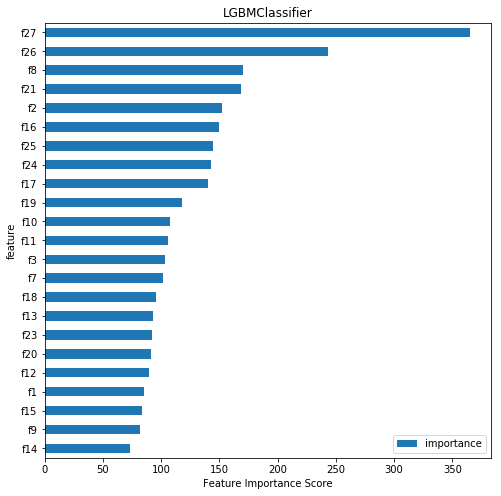

,importance
feature,
f14,73
f9,82
f15,84
f1,85
f12,90
f20,91
f23,92
f13,93
f18,96


In [55]:
lgbm = LGBMClassifier(objective='binary')
lgbm.fit(X_features_1, y)
plot_feature_importances(lgbm, X_features_1, y, top_n=X.shape[1], title=lgbm.__class__.__name__)

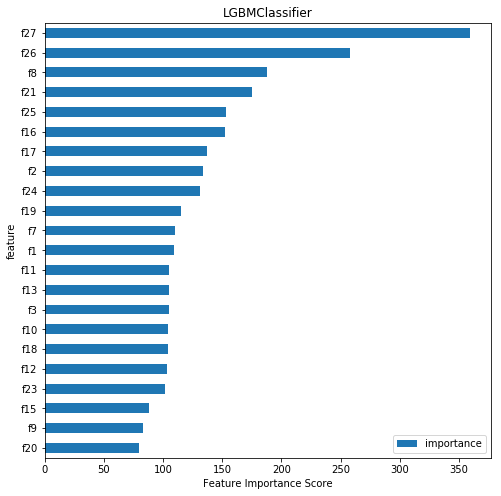

,importance
feature,
f20,80
f9,83
f15,88
f23,102
f12,103
f18,104
f10,104
f3,105
f13,105


In [60]:
lgbm = LGBMClassifier(objective='binary')
lgbm.fit(X_features_2, y)
plot_feature_importances(lgbm, X_features_2, y, top_n=X.shape[1], title=lgbm.__class__.__name__)

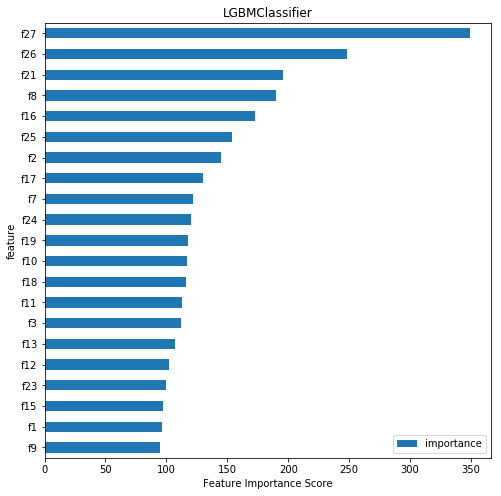

,importance
feature,
f9,95
f1,96
f15,97
f23,100
f12,102
f13,107
f3,112
f11,113
f18,116


In [63]:
lgbm = LGBMClassifier(objective='binary')
lgbm.fit(X_features_3, y)
plot_feature_importances(lgbm, X_features_3, y, top_n=X.shape[1], title=lgbm.__class__.__name__)

## with selected features

### on raw data

In [62]:
lgbm = LGBMClassifier(objective='binary', n_jobs=1)
# cross_val_score(bst, X_minmax_transform, y, cv=10, scoring='roc_auc').mean()
params = {
    'learning_rate': [0.02],
    'max_depth': [-1],
    'num_leaves': [15, 20],
    'min_data_in_leaf': [60, 80],
    'feature_fraction': [0.6, 0.7, 0.8],
    'num_iterations': [400],
    'max_bin':[300],
    'bagging_fraction': [0.5, 0.6, 0.7],
    'bagging_freq': [1]
}
clf = GridSearchCV(lgbm, params, cv=scv_10, scoring='roc_auc', return_train_score=True, n_jobs=-1, verbose = 1)
clf.fit(X_selected_sbs, y, verbose=False)
print(clf.best_score_)
print(clf.best_params_)
# 0.9328157716092099
# {'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.8, 'learning_rate': 0.02, 'max_bin': 300, 'max_depth': -1, 'min_data_in_leaf': 80, 'num_iterations': 400, 'num_leaves': 15}
# 0.9327080974180606
# {'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.75, 'learning_rate': 0.02, 'max_bin': 300, 'max_depth': -1, 'min_data_in_leaf': 60, 'num_iterations': 400, 'num_leaves': 20}

Fitting 10 folds for each of 36 candidates, totalling 360 fits


[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:   14.3s
[Parallel(n_jobs=-1)]: Done 360 out of 360 | elapsed:   33.7s finished


0.9327611721287562
{'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6, 'learning_rate': 0.02, 'max_bin': 300, 'max_depth': -1, 'min_data_in_leaf': 80, 'num_iterations': 400, 'num_leaves': 20}


### on scaled data

In [36]:
lgbm = LGBMClassifier(objective='binary')
# cross_val_score(bst, X_minmax_transform, y, cv=10, scoring='roc_auc').mean()
params = {
    'learning_rate': [0.02],
    'max_depth': [-1],
    'num_leaves': [20, 40],
    'min_data_in_leaf': [80],
    'feature_fraction': [0.75],
    'num_iterations': [400],
    'max_bin':[200, 300],
    'bagging_fraction': [0.6, 0.8],
    'bagging_freq': [1]
}
clf = GridSearchCV(lgbm, params, scoring='roc_auc', return_train_score=True, n_jobs=4, verbose = 1)
clf.fit(X_rbs_selected, y, verbose=False)
print(clf.best_score_)
print(clf.best_params_)
# 0.9313793082563261
# {'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.75, 'learning_rate': 0.02, 'max_bin': 200, 'max_depth': -1, 'min_data_in_leaf': 80, 'num_iterations': 400, 'num_leaves': 20}

Fitting 3 folds for each of 8 candidates, totalling 24 fits


[Parallel(n_jobs=4)]: Done  24 out of  24 | elapsed:   55.6s finished


0.9313793082563261
{'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.75, 'learning_rate': 0.02, 'max_bin': 200, 'max_depth': -1, 'min_data_in_leaf': 80, 'num_iterations': 400, 'num_leaves': 20}


## with all features

### on raw data

In [25]:
lgbm = LGBMClassifier(objective='binary')
# cross_val_score(bst, X_minmax_transform, y, cv=10, scoring='roc_auc').mean()
params = {
    'learning_rate': [0.02],
    'max_depth': [-1],
    'num_leaves': [20, 40],
    'min_data_in_leaf': [80, 100],
    'feature_fraction': [0.75],
    'num_iterations': [400, 500],
    'max_bin':[500, 600, 700]
    # 'bagging_fraction': [0.8, 1.0],
    # 'bagging_freq': [0, 1]
}
clf = GridSearchCV(lgbm, params, scoring='roc_auc', return_train_score=True, n_jobs=4, verbose = 3)
clf.fit(X, y, verbose=False)
print(clf.best_score_)
print(clf.best_params_)
# 0.9314095910920452
# {'feature_fraction': 0.75, 'learning_rate': 0.02, 'max_depth': -1, 'min_data_in_leaf': 80, 'num_iterations': 400, 'num_leaves': 20}
# 0.931336236501028
# {'feature_fraction': 0.75, 'learning_rate': 0.02, 'max_bin': 500, 'max_depth': -1, 'min_data_in_leaf': 80, 'num_iterations': 400, 'num_leaves': 20}

Fitting 3 folds for each of 24 candidates, totalling 72 fits
[CV] feature_fraction=0.75, learning_rate=0.02, max_bin=500, max_depth=-1, min_data_in_leaf=80, num_iterations=400, num_leaves=20 
[CV] feature_fraction=0.75, learning_rate=0.02, max_bin=500, max_depth=-1, min_data_in_leaf=80, num_iterations=400, num_leaves=20 
[CV] feature_fraction=0.75, learning_rate=0.02, max_bin=500, max_depth=-1, min_data_in_leaf=80, num_iterations=400, num_leaves=20 
[CV] feature_fraction=0.75, learning_rate=0.02, max_bin=500, max_depth=-1, min_data_in_leaf=80, num_iterations=400, num_leaves=40 
[CV]  feature_fraction=0.75, learning_rate=0.02, max_bin=500, max_depth=-1, min_data_in_leaf=80, num_iterations=400, num_leaves=20, score=0.9356142573414907, total=   7.5s
[CV] feature_fraction=0.75, learning_rate=0.02, max_bin=500, max_depth=-1, min_data_in_leaf=80, num_iterations=400, num_leaves=40 
[CV]  feature_fraction=0.75, learning_rate=0.02, max_bin=500, max_depth=-1, min_data_in_leaf=80, num_iterations=

[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:  1.4min


[CV]  feature_fraction=0.75, learning_rate=0.02, max_bin=500, max_depth=-1, min_data_in_leaf=100, num_iterations=500, num_leaves=40, score=0.9345415743452048, total=  19.3s
[CV] feature_fraction=0.75, learning_rate=0.02, max_bin=600, max_depth=-1, min_data_in_leaf=80, num_iterations=400, num_leaves=40 
[CV]  feature_fraction=0.75, learning_rate=0.02, max_bin=600, max_depth=-1, min_data_in_leaf=80, num_iterations=400, num_leaves=20, score=0.9250452144650295, total=   9.4s
[CV] feature_fraction=0.75, learning_rate=0.02, max_bin=600, max_depth=-1, min_data_in_leaf=80, num_iterations=400, num_leaves=40 
[CV]  feature_fraction=0.75, learning_rate=0.02, max_bin=600, max_depth=-1, min_data_in_leaf=80, num_iterations=400, num_leaves=20, score=0.9355270244640385, total=  10.1s
[CV] feature_fraction=0.75, learning_rate=0.02, max_bin=600, max_depth=-1, min_data_in_leaf=80, num_iterations=500, num_leaves=20 
[CV]  feature_fraction=0.75, learning_rate=0.02, max_bin=600, max_depth=-1, min_data_in_le

[CV]  feature_fraction=0.75, learning_rate=0.02, max_bin=700, max_depth=-1, min_data_in_leaf=80, num_iterations=400, num_leaves=40, score=0.93129538317572, total=  18.9s
[CV] feature_fraction=0.75, learning_rate=0.02, max_bin=700, max_depth=-1, min_data_in_leaf=80, num_iterations=500, num_leaves=20 
[CV]  feature_fraction=0.75, learning_rate=0.02, max_bin=700, max_depth=-1, min_data_in_leaf=80, num_iterations=500, num_leaves=20, score=0.9319291730026904, total=  11.2s
[CV] feature_fraction=0.75, learning_rate=0.02, max_bin=700, max_depth=-1, min_data_in_leaf=80, num_iterations=500, num_leaves=20 
[CV]  feature_fraction=0.75, learning_rate=0.02, max_bin=700, max_depth=-1, min_data_in_leaf=80, num_iterations=400, num_leaves=40, score=0.9350689111592235, total=  16.3s
[CV] feature_fraction=0.75, learning_rate=0.02, max_bin=700, max_depth=-1, min_data_in_leaf=80, num_iterations=500, num_leaves=40 
[CV]  feature_fraction=0.75, learning_rate=0.02, max_bin=700, max_depth=-1, min_data_in_leaf=

[Parallel(n_jobs=4)]: Done  72 out of  72 | elapsed:  4.4min finished


0.931336236501028
{'feature_fraction': 0.75, 'learning_rate': 0.02, 'max_bin': 500, 'max_depth': -1, 'min_data_in_leaf': 80, 'num_iterations': 400, 'num_leaves': 20}


## Evaluation

In [8]:
params = {'objective': 'binary',
          'bagging_fraction': 0.6, 
          'bagging_freq': 1, 
          'feature_fraction': 0.75, 
          'learning_rate': 0.02, 
          'max_bin': 300, 
          'max_depth': -1, 
          'min_data_in_leaf': 80, 
          'num_iterations': 400, 
          'num_leaves': 20}

### tuned model

In [9]:
lgbm = LGBMClassifier(**params)

scores = cross_val_score(lgbm, X_selected, y, cv=10, scoring='roc_auc')

In [12]:
print(scores.mean())
print(scores.std())

0.9319227992426447
0.009405828594043864


### raw model

In [12]:
lgbm = LGBMClassifier()

scores = cross_val_score(lgbm, X_selected, y, cv=10, scoring='roc_auc')

In [13]:
print(scores.mean())
print(scores.std())

0.9291600330277259
0.009044398187287805


## Test

In [27]:
params = {'bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.75, 'learning_rate': 0.02, 
           'max_bin': 400, 'max_depth': -1, 'min_data_in_leaf': 80, 'num_iterations': 400, 'num_leaves': 20}
lgbm = LGBMClassifier(**params)
lgbm.fit(X_selected_sbs, y)
#lgbm_raw = LGBMClassifier(**params)
#lgbm_raw.fit(X_selected, y)

LGBMClassifier(bagging_fraction=0.6, bagging_freq=1, boosting_type='gbdt',
        class_weight=None, colsample_bytree=1.0, feature_fraction=0.75,
        learning_rate=0.02, max_bin=400, max_depth=-1,
        min_child_samples=20, min_child_weight=0.001, min_data_in_leaf=80,
        min_split_gain=0.0, n_estimators=100, n_jobs=-1,
        num_iterations=400, num_leaves=20, objective=None,
        random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
        subsample=1.0, subsample_for_bin=200000, subsample_freq=1)

In [28]:
#%%
try:
    data = pd.read_csv("./data/testdata_nolabels.csv")
    print("Dataset has {} samples with {} features each.".format(*data.shape))
except:
    print("Dataset could not be loaded. Is the dataset missing?")
X_test = data.drop(['ID'], axis = 1, inplace=False)
X_test_minmax_transform = scaler.transform(X_test)
X_test_std_transform = scaler_std.transform(X_test)
X_test_rbs_transform = scaler_rbs.fit_transform(X_test)
X_test_new_raw = model_select_raw.transform(X_test)
X_test_new = model_select.transform(X_test_rbs_transform)

#%%
y_prob = lgbm.predict_proba(X_test_selected_sbs)

#%%
result = pd.DataFrame()
result['score'] = y_prob[:, 1]
result.index += 1
result.to_csv('./results/out_x_light_selected_tuned.csv', index_label='Id')
#%%


Dataset has 4000 samples with 28 features each.


# Random Forest

In [ ]:
from sklearn.feature_selection import RFECV

clf_rf_4 = RandomForestClassifier(n_jobs=-1, 
                            criterion='entropy',
                            bootstrap=True, 
                            max_features=8, 
                            min_samples_leaf= 4, 
                            min_samples_split= 5, 
                            n_estimators= 4000)
rfecv = RFECV(estimator=clf_rf_4, step=1, cv=5,scoring='roc_auc', n_jobs=-1)   #5-fold cross-validation
rfecv = rfecv.fit(X, y)

print('Optimal number of features :', rfecv.n_features_)
print('Best features :', X.columns[rfecv.support_])

In [11]:
rf_features = ['f2', 'f8', 'f16', 'f18', 'f21', 'f24', 'f25', 'f26', 'f27']
X_selected = X[X.columns.intersection(rf_features)]

lgbm_features = ['f1', 'f2', 'f3', 'f4', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13',
       'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20', 'f21', 'f23', 'f24',
       'f25', 'f26', 'f27']
X_selected_lgbm = X[X.columns.intersection(lgbm_features)]

## Experiments

In [160]:
# cross_val_score(bst, X_minmax_transform, y, cv=10, scoring='roc_auc').mean()
parameters = {'bootstrap': [True],
                 'max_features': [5, 8, 10],
                 'min_samples_leaf': [4],
                 'min_samples_split': [5, 6, 8],
                 'n_estimators': [1500, 2000, 3000]
             }

rfc = RandomForestClassifier(n_jobs=1, criterion='entropy')
clf = GridSearchCV(rfc, parameters, n_jobs=-1, cv=scv_3, scoring='roc_auc', return_train_score=True, verbose=1)
clf.fit(X_selected_sbs, y)

print(clf.best_score_)
print(clf.best_params_)

Fitting 3 folds for each of 27 candidates, totalling 81 fits


[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  81 out of  81 | elapsed: 13.7min finished


0.9285902334352752
{'bootstrap': True, 'max_features': 8, 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 1500}


# Neural Network

## Experiments - Keras

In [37]:
kfold = StratifiedKFold(n_splits=5, shuffle=True)
cvscores = []
aucs = []
X_selected_a = X_selected.as_matrix()
histories = []
sgd = keras.optimizers.SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
for train, test in kfold.split(X_selected, y):
    model = Sequential()
    model.add(Dense(64, activation='relu', input_shape=(24,)))
    model.add(Dropout(.2))
    model.add(Dense(32, activation='relu'))
    model.add(Dropout(.1))
    model.add(Dense(2, activation='sigmoid'))

    # Compile model
    model.compile(loss='binary_crossentropy', optimizer=sgd, metrics=['accuracy'])
    # Fit the modellbfgs
    history = model.fit(X_selected_a[train], to_categorical(y[train]), epochs=300, batch_size=200, verbose=0)
    histories.append(history)
    # evaluate the model
    scores = model.evaluate(X_selected_a[test], to_categorical(y[test]), verbose=0)
    y_pred = model.predict_proba(X_selected_a[test])[:, 1]
    fpr, tpr, thresholds = roc_curve(y[test], y_pred, pos_label=1)
    print("%s: %.8f%%, %.8f" % (model.metrics_names[1], scores[1] * 100, auc(fpr, tpr)))
    cvscores.append(scores[1] * 100)
    aucs.append(auc(fpr, tpr))
print("%.8f%% (+/- %.8f%%); %.8f+/- %.8f" % (np.mean(cvscores), np.std(cvscores), np.mean(aucs), np.std(aucs)))
# 83.12502760% (+/- 0.29045357%); 0.91112330


/home/zhaoxiangc/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  after removing the cwd from sys.path.


acc: 83.38538413%, 0.91439134
acc: 79.10680824%, 0.90730632
acc: 79.78125000%, 0.89217973
acc: 50.59412130%, 0.50376884
acc: 49.78111316%, 0.50125628
68.52973537% (+/- 15.04897630%); 0.74378050+/- 0.19712670


In [11]:
# %%
# model.fit(X_train, y_train, epochs=500, batch_size=100, verbose=0, validation_split=0.1)
model = Sequential()
model.add(Dense(64, activation='relu', input_shape=(24,)))
model.add(Dropout(.1))
model.add(Dense(32, activation='relu'))
model.add(Dropout(.1))
model.add(Dense(2, activation='sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


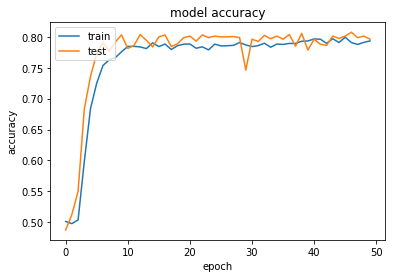

In [13]:
# Compile model
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## Experiment - sklearn

In [31]:
nn = MLPClassifier(solver='lbfgs', hidden_layer_sizes=(128, 64, 32), max_iter=300)

scores = cross_val_score(nn, X_selected, y, cv=5, scoring='roc_auc')
print(scores.mean())
print(scores.std())

0.9023252245782676
0.007728208964118867


In [28]:
nn = MLPClassifier()
scores = cross_val_score(nn, X, y, cv=scv_10, scoring='roc_auc')
print(scores.mean())
print(scores.std())

0.873930439263894
0.021180528942810233


In [49]:
nn = MLPClassifier(solver='lbfgs')
params = {'hidden_layer_sizes': [(64, 16, 4), (24, 12, 4)],
          'max_iter': [300, 600, 1000],
          'batch_size': [60, 100, 150, 200]
         }

clf = GridSearchCV(nn, params, scoring='roc_auc', return_train_score=True, n_jobs=4, verbose=1)
clf.fit(X_selected, y)
print(clf.best_score_)
print(clf.best_params_)

Fitting 3 folds for each of 24 candidates, totalling 72 fits


[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:  1.6min
[Parallel(n_jobs=4)]: Done  72 out of  72 | elapsed:  2.6min finished


0.9060146071609038
{'batch_size': 60, 'hidden_layer_sizes': (64, 16, 4), 'max_iter': 300}


### on raw data

In [ ]:
nn = MLPClassifier(solver='lbfgs')
params = {'hidden_layer_sizes': [(64, 16, 4), (24, 12, 4)],
          'max_iter': [300, 600, 1000],
          'batch_size': [60, 100, 150, 200]
         }

clf = GridSearchCV(nn, params, scoring='roc_auc', return_train_score=True, n_jobs=4, verbose=1)
clf.fit(X, y)
print(clf.best_score_)
print(clf.best_params_)

In [141]:
nn = MLPClassifier(solver='lbfgs')
nn.fit(X, y)

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(100,), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       nesterovs_momentum=True, power_t=0.5, random_state=None,
       shuffle=True, solver='lbfgs', tol=0.0001, validation_fraction=0.1,
       verbose=False, warm_start=False)

In [143]:
nn.predict_proba(X_test)

array([[1.16884717e-03, 9.98831153e-01],
       [6.02265109e-05, 9.99939773e-01],
       [2.79805532e-01, 7.20194468e-01],
       ...,
       [3.85181537e-03, 9.96148185e-01],
       [9.42648298e-01, 5.73517025e-02],
       [9.05058593e-01, 9.49414066e-02]])

# SVM

In [82]:
svc = SVC()
parameters = {'C': [45000, 50000, 55000], 'gamma': [5e-5,1e-4,5e-4]}
clf = GridSearchCV(svc, parameters, n_jobs=-1, scoring='roc_auc', cv=scv_10, return_train_score=True, verbose=1)
clf.fit(X_robust_transform, y)
print(clf.best_score_)
print(clf.best_params_)
# 0.914898057936924
# {'C': 50000, 'gamma': 0.0001}

Fitting 10 folds for each of 9 candidates, totalling 90 fits


[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   11.7s
[Parallel(n_jobs=-1)]: Done  90 out of  90 | elapsed:  2.3min finished


0.914898057936924
{'C': 50000, 'gamma': 0.0001}


In [72]:
svc = SVC()
parameters = {'C': [150, 170, 200, 250], 'gamma': [5e-6, 1e-5]}
clf = GridSearchCV(svc, parameters, n_jobs=-1, scoring='roc_auc', cv=scv_3, return_train_score=True, verbose=3)
clf.fit(X, y)
print(clf.best_score_)
print(clf.best_params_)
0.9107869234758088
{'C': 200, 'gamma': 1e-05}

Fitting 3 folds for each of 8 candidates, totalling 24 fits
[CV] C=150, gamma=5e-06 ..............................................
[CV] C=150, gamma=1e-05 ..............................................
[CV] C=170, gamma=5e-06 ..............................................
[CV] C=170, gamma=5e-06 ..............................................
[CV] C=150, gamma=5e-06 ..............................................
[CV] C=170, gamma=5e-06 ..............................................
[CV] C=150, gamma=5e-06 ..............................................
[CV] C=150, gamma=1e-05 ..............................................
[CV] C=150, gamma=1e-05 ..............................................
[CV] C=170, gamma=1e-05 ..............................................
[CV] C=170, gamma=1e-05 ..............................................
[CV] C=170, gamma=1e-05 ..............................................
[CV] C=200, gamma=5e-06 ..............................................
[CV] C=200, gamma

[Parallel(n_jobs=-1)]: Done   4 out of  24 | elapsed:    3.6s remaining:   17.8s
[Parallel(n_jobs=-1)]: Done  13 out of  24 | elapsed:    3.7s remaining:    3.2s


[CV] ..... C=170, gamma=5e-06, score=0.9162351422118645, total=   2.6s
[CV] ..... C=200, gamma=1e-05, score=0.9081589614619794, total=   2.6s
[CV] ..... C=250, gamma=1e-05, score=0.9080605468925741, total=   2.6s
[CV] ..... C=250, gamma=5e-06, score=0.9072805411339158, total=   2.6s
[CV] ..... C=150, gamma=1e-05, score=0.9080762932236789, total=   2.7s
[CV] ..... C=200, gamma=5e-06, score=0.9164915824612865, total=   2.6s
[CV] ..... C=250, gamma=1e-05, score=0.9070530876780465, total=   2.7s
[CV] ..... C=170, gamma=1e-05, score=0.9172310976542465, total=   2.7s
[CV] ..... C=200, gamma=1e-05, score=0.9171034398985036, total=   2.7s
[CV] ..... C=250, gamma=5e-06, score=0.9169358539460306, total=   2.8s


[Parallel(n_jobs=-1)]: Done  22 out of  24 | elapsed:    3.8s remaining:    0.3s


[CV] ..... C=250, gamma=1e-05, score=0.9167975111798952, total=   3.0s


[Parallel(n_jobs=-1)]: Done  24 out of  24 | elapsed:    4.1s finished


0.9107869234758088
{'C': 200, 'gamma': 1e-05}


# Stacking

## Experiments

In [20]:
cat_selected_params = {'eval_metric':"AUC", 'bagging_temperature': 0.65, 'border_count': 130, 'depth': 10, 
                       'iterations': 2200, 'l2_leaf_reg': 20, 'learning_rate': 0.007, 'od_pval': 0, 
                       'thread_count': 1, 'logging_level':"Silent", 'random_state' :seed}

lightgbm_selected_params = {'objective': 'binary','bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.75,  
'learning_rate': 0.02, 'max_bin': 350, 'max_depth': -1, 'min_data_in_leaf': 60, 'num_iterations': 400, 
                            'num_leaves': 15, 'random_state':seed}

xgb_alson_param = {'base_score':0.5, 'booster':'gbtree', 'colsample_bylevel':1,'colsample_bytree':0.9, 
                   'gamma':3, 'learning_rate':0.01, 'max_delta_step':0,'max_depth':5, 'min_child_weight':4, 
                   'missing':None, 'n_estimators':1100,'n_jobs':1,'nthread':None, 'objective':'binary:logistic',
                   'reg_alpha':1.5, 'reg_lambda':1.5,'scale_pos_weight':1.0, 'silent':True,'subsample':0.7, 'random_state':seed}

lr_params = {'C': 0.005, 'max_iter': 1200, 'solver': 'saga', 'random_state': seed}

svm_params =  {'C': 60000, 'gamma': 0.0001, 'probability': True, 'random_state': seed}
    
xgb_alson_param_old = {'base_score':0.5, 'booster':'gbtree', 'colsample_bylevel':1,'colsample_bytree':1.0,
'gamma':0, 'learning_rate':0.08, 'max_delta_step':0,'max_depth':5, 'min_child_weight':2,
'missing':None, 'n_estimators':120,'n_jobs':3,'nthread':None, 'objective':'binary:logistic',
'reg_alpha':1.0, 'reg_lambda':1.0,'scale_pos_weight':0.8, 'silent':True,'subsample':0.7}

cat_full_params = {'eval_metric':"AUC",'bagging_temperature': 0.5, 'border_count': 90, 'logging_level':"Silent",
                   'depth': 10, 'iterations': 2200, 'l2_leaf_reg': 15, 'learning_rate': 0.007}

light_full_params = {'objective': 'binary','feature_fraction': 0.75, 'learning_rate': 0.02, 
                     'max_depth': -1, 'min_data_in_leaf': 80, 'num_iterations': 400, 'num_leaves': 20}
nn_selected_params = {'batch_size': 60, 'hidden_layer_sizes': (64, 16, 4), 'max_iter': 300}


rf_params = {'n_jobs':1, 'criterion':'entropy', 'bootstrap': True, 'max_features': 8, 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 1500}
lr_avg_params = {'C': 2500, 'max_iter': 3000, 'solver': 'saga'}


svm_meta_avg_params = {'C': 100, 'gamma': 0.01, 'probability': True}

In [21]:
rf = RandomForestClassifier(**rf_params)

xgboost = XGBClassifier(**xgb_alson_param)
xgboost_old = XGBClassifier(**xgb_alson_param_old)
xgboost_raw = XGBClassifier(n_jobs=1)

cat = CatBoostClassifier(**cat_selected_params)
cat_raw = CatBoostClassifier(eval_metric="AUC", logging_level="Silent", thread_count=3)
cat_meta = CatBoostClassifier(eval_metric="AUC", logging_level="Silent")

lgbm = LGBMClassifier(n_jobs=1,**lightgbm_selected_params)
lgbm_raw = LGBMClassifier(n_jobs=1)

nn = MLPClassifier(solver='lbfgs', **nn_selected_params)

svm = SVC(**svm_params)
knn = KNeighborsClassifier(n_jobs=-1, n_neighbors=60)

svm_meta_avg = SVC(**svm_meta_avg_params)

lr_avg = LogisticRegression(**lr_avg_params)
lr = LogisticRegression(**lr_params)

ada = AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=0.09, n_estimators=450, random_state = seed)

### LR Grid search

In [12]:
lr_avg = LogisticRegression(n_jobs=4)
lr = LogisticRegression(n_jobs=4)

In [163]:
params = {'meta-logisticregression__C': [1e-3, 1e-4],
          'meta-logisticregression__max_iter': [2500, 3000],
          'meta-logisticregression__solver': ['saga']}
sclf = StackingClassifier(classifiers=[cat, cat_raw, lgbm, xgboost],
                          use_probas=True,
                          average_probas=False,
                          meta_classifier=lr)
grid_avg = GridSearchCV(estimator=sclf, 
                    param_grid=params, cv=scv_5,
                    scoring='roc_auc', return_train_score=True, n_jobs=6, verbose = 1)
grid_avg.fit(X_selected_sbs, y)
print(grid_avg.best_params_)
print(grid_avg.best_score_)

# {'meta-logisticregression__C': 0.001, 'meta-logisticregression__max_iter': 2500, 'meta-logisticregression__solver': 'saga'}
# 0.9324032669591547

Fitting 3 folds for each of 3 candidates, totalling 9 fits


[Parallel(n_jobs=6)]: Done   9 out of   9 | elapsed: 14.0min finished


{'meta-logisticregression__C': 100000.0, 'meta-logisticregression__max_iter': 2500, 'meta-logisticregression__solver': 'saga'}
0.892075035922727


In [14]:
params = {'meta-logisticregression__C': [2500],
          'meta-logisticregression__max_iter': [3500, 4500, 5500],
          'meta-logisticregression__solver': ['saga']}
sclf_avg = StackingClassifier(classifiers=[cat, cat_raw, lgbm, xgboost],
                          use_probas=True,
                          average_probas=True,
                          meta_classifier=lr_avg)
grid_avg = GridSearchCV(estimator=sclf_avg, 
                    param_grid=params, cv=scv_3,
                    scoring='roc_auc', return_train_score=True, n_jobs=6, verbose = 1)
grid_avg.fit(X_selected_sbs, y)
print(grid_avg.best_params_)
print(grid_avg.best_score_)
# {'meta-logisticregression__C': 1.0, 'meta-logisticregression__max_iter': 500}
# 0.9333970073093183
# {'meta-logisticregression__C': 3000, 'meta-logisticregression__max_iter': 1700, 'meta-logisticregression__solver': 'saga'}
# 0.9335669398050556
# {'meta-logisticregression__C': 3000, 'meta-logisticregression__max_iter': 2000, 'meta-logisticregression__solver': 'saga'}
# 0.9339481904899262
# {'meta-logisticregression__C': 3000, 'meta-logisticregression__max_iter': 2200, 'meta-logisticregression__solver': 'saga'}
# 0.9320021578932169
# {'meta-logisticregression__C': 2500, 'meta-logisticregression__max_iter': 2500, 'meta-logisticregression__solver': 'saga'}
# 0.9320617518418804
# {'meta-logisticregression__C': 2500, 'meta-logisticregression__max_iter': 3500, 'meta-logisticregression__solver': 'saga'}
# 0.9323263376269362

Fitting 3 folds for each of 3 candidates, totalling 9 fits


[Parallel(n_jobs=6)]: Done   9 out of   9 | elapsed: 13.2min finished


{'meta-logisticregression__C': 2500, 'meta-logisticregression__max_iter': 4500, 'meta-logisticregression__solver': 'saga'}
0.9324217939041275


In [ ]:
params = {'meta-logisticregression__C': [1.0],
          'meta-logisticregression__max_iter': [500, 800]}
sclf_avg = StackingClassifier(classifiers=[cat, cat_raw, lgbm, xgboost],
                          use_probas=True,
                          average_probas=True,
                          meta_classifier=lr_avg)
grid_avg = GridSearchCV(estimator=sclf_avg, 
                    param_grid=params, cv=scv_3,
                    scoring='roc_auc', return_train_score=True, n_jobs=6, verbose = 1)
grid_avg.fit(X_selected_sbs, y)
print(grid_avg.best_params_)
print(grid_avg.best_score_)

### SVM meta

In [34]:
svm_meta = SVC(probability=True)
params = {'meta-svc__C': [0.1, 1, 10, 100, 1000, 10000],
          'meta-svc__gamma': [1.0, 0.1, 1e-2, 1e-3,1e-4]}
sclf_avg = StackingClassifier(classifiers=[cat, cat_raw, lgbm, xgboost],
                          use_probas=True,
                          average_probas=True,
                          meta_classifier=svm_meta)
grid_avg = GridSearchCV(estimator=sclf_avg, 
                    param_grid=params, cv=scv_3,
                    scoring='roc_auc', return_train_score=True, n_jobs=6, verbose = 3)
grid_avg.fit(X_selected_sbs, y)
print(grid_avg.best_params_)
print(grid_avg.best_score_)
# {'meta-svc__C': 100, 'meta-svc__gamma': 0.01}
# 0.9324407424817379

Fitting 3 folds for each of 30 candidates, totalling 90 fits
[CV] meta-svc__C=0.1, meta-svc__gamma=1.0 ............................
[CV] meta-svc__C=0.1, meta-svc__gamma=0.1 ............................
[CV] meta-svc__C=0.1, meta-svc__gamma=1.0 ............................
[CV] meta-svc__C=0.1, meta-svc__gamma=1.0 ............................
[CV] meta-svc__C=0.1, meta-svc__gamma=0.1 ............................
[CV] meta-svc__C=0.1, meta-svc__gamma=0.1 ............................
[CV]  meta-svc__C=0.1, meta-svc__gamma=0.1, score=0.9268369414915021, total= 8.6min
[CV] meta-svc__C=0.1, meta-svc__gamma=0.01 ...........................
[CV]  meta-svc__C=0.1, meta-svc__gamma=1.0, score=0.9150464332164788, total= 8.6min
[CV] meta-svc__C=0.1, meta-svc__gamma=0.01 ...........................
[CV]  meta-svc__C=0.1, meta-svc__gamma=1.0, score=0.9115806954479608, total= 8.6min
[CV] meta-svc__C=0.1, meta-svc__gamma=0.01 ...........................
[CV]  meta-svc__C=0.1, meta-svc__gamma=0.1, scor

[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed: 34.3min


[CV]  meta-svc__C=1, meta-svc__gamma=0.1, score=0.9266028197042749, total= 8.6min
[CV] meta-svc__C=1, meta-svc__gamma=0.001 ............................
[CV]  meta-svc__C=1, meta-svc__gamma=0.01, score=0.9334891845200068, total= 8.6min
[CV] meta-svc__C=1, meta-svc__gamma=0.0001 ...........................
[CV]  meta-svc__C=1, meta-svc__gamma=0.01, score=0.936410691308925, total= 8.6min
[CV] meta-svc__C=1, meta-svc__gamma=0.0001 ...........................
[CV]  meta-svc__C=1, meta-svc__gamma=0.01, score=0.9266956805093048, total= 8.6min
[CV] meta-svc__C=1, meta-svc__gamma=0.0001 ...........................
[CV]  meta-svc__C=1, meta-svc__gamma=0.001, score=0.9334517869836327, total= 8.5min
[CV] meta-svc__C=10, meta-svc__gamma=1.0 .............................
[CV]  meta-svc__C=1, meta-svc__gamma=0.001, score=0.9361593123802154, total= 8.6min
[CV] meta-svc__C=10, meta-svc__gamma=1.0 .............................
[CV]  meta-svc__C=1, meta-svc__gamma=0.001, score=0.926537535744375, total= 

[CV]  meta-svc__C=1000, meta-svc__gamma=0.0001, score=0.9361671855457678, total= 8.5min
[CV] meta-svc__C=10000, meta-svc__gamma=0.1 ..........................
[CV]  meta-svc__C=1000, meta-svc__gamma=0.0001, score=0.9271017354840272, total= 8.6min
[CV] meta-svc__C=10000, meta-svc__gamma=0.1 ..........................
[CV]  meta-svc__C=10000, meta-svc__gamma=1.0, score=0.9214668607214518, total= 8.9min
[CV] meta-svc__C=10000, meta-svc__gamma=0.01 .........................
[CV]  meta-svc__C=10000, meta-svc__gamma=1.0, score=0.9202362266321412, total= 8.9min
[CV] meta-svc__C=10000, meta-svc__gamma=0.01 .........................
[CV]  meta-svc__C=10000, meta-svc__gamma=1.0, score=0.9174071191412401, total= 9.0min
[CV] meta-svc__C=10000, meta-svc__gamma=0.01 .........................
[CV]  meta-svc__C=10000, meta-svc__gamma=0.1, score=0.8866815282039284, total= 8.4min
[CV] meta-svc__C=10000, meta-svc__gamma=0.001 ........................
[CV]  meta-svc__C=10000, meta-svc__gamma=0.1, score=0.

[Parallel(n_jobs=6)]: Done  90 out of  90 | elapsed: 128.7min finished


{'meta-svc__C': 100, 'meta-svc__gamma': 0.01}
0.9324407424817379


### XGB meta

In [18]:
xgb_meta = XGBClassifier(n_jobs=-1)
params = {'meta-xgbclassifier__learning_rate': [0.08],
          'meta-xgbclassifier__max_depth': [2, 3],
         'meta-xgbclassifier__min_child_weight': [2],
         'meta-xgbclassifier__n_estimators':[60, 80]}
sclf = StackingClassifier(classifiers=[cat, cat_raw, lgbm, xgboost],
                          use_probas=True,
                          average_probas=False,
                          meta_classifier=xgb_meta)
grid = GridSearchCV(estimator=sclf, 
                    param_grid=params, cv=scv_5,
                    scoring='roc_auc', return_train_score=True, n_jobs=-1, verbose = 3)
grid.fit(X_selected_sbs, y)
print(grid.best_params_)
print(grid.best_score_)
# {'meta-xgbclassifier__learning_rate': 0.08, 'meta-xgbclassifier__max_depth': 3, 'meta-xgbclassifier__min_child_weight': 2, 'meta-xgbclassifier__n_estimators': 100}
# 0.9250247115989937

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] meta-xgbclassifier__learning_rate=0.08, meta-xgbclassifier__max_depth=2, meta-xgbclassifier__min_child_weight=2, meta-xgbclassifier__n_estimators=60 
[CV] meta-xgbclassifier__learning_rate=0.08, meta-xgbclassifier__max_depth=2, meta-xgbclassifier__min_child_weight=2, meta-xgbclassifier__n_estimators=60 
[CV] meta-xgbclassifier__learning_rate=0.08, meta-xgbclassifier__max_depth=2, meta-xgbclassifier__min_child_weight=2, meta-xgbclassifier__n_estimators=60 
[CV] meta-xgbclassifier__learning_rate=0.08, meta-xgbclassifier__max_depth=2, meta-xgbclassifier__min_child_weight=2, meta-xgbclassifier__n_estimators=60 
[CV] meta-xgbclassifier__learning_rate=0.08, meta-xgbclassifier__max_depth=2, meta-xgbclassifier__min_child_weight=2, meta-xgbclassifier__n_estimators=60 
[CV] meta-xgbclassifier__learning_rate=0.08, meta-xgbclassifier__max_depth=2, meta-xgbclassifier__min_child_weight=2, meta-xgbclassifier__n_estimators=80 
[CV] meta-

[Parallel(n_jobs=-1)]: Done   8 out of  20 | elapsed: 10.7min remaining: 16.0min


[CV]  meta-xgbclassifier__learning_rate=0.08, meta-xgbclassifier__max_depth=2, meta-xgbclassifier__min_child_weight=2, meta-xgbclassifier__n_estimators=80, score=0.9246318595229623, total=10.9min
[CV]  meta-xgbclassifier__learning_rate=0.08, meta-xgbclassifier__max_depth=3, meta-xgbclassifier__min_child_weight=2, meta-xgbclassifier__n_estimators=60, score=0.9276896081351145, total=11.0min
[CV]  meta-xgbclassifier__learning_rate=0.08, meta-xgbclassifier__max_depth=2, meta-xgbclassifier__min_child_weight=2, meta-xgbclassifier__n_estimators=80, score=0.9311371311572627, total=11.2min
[CV]  meta-xgbclassifier__learning_rate=0.08, meta-xgbclassifier__max_depth=2, meta-xgbclassifier__min_child_weight=2, meta-xgbclassifier__n_estimators=60, score=0.9251850846145683, total=11.2min
[CV]  meta-xgbclassifier__learning_rate=0.08, meta-xgbclassifier__max_depth=2, meta-xgbclassifier__min_child_weight=2, meta-xgbclassifier__n_estimators=60, score=0.9305466795626814, total=11.4min
[CV]  meta-xgbclassi

[Parallel(n_jobs=-1)]: Done  15 out of  20 | elapsed: 11.7min remaining:  3.9min


[CV]  meta-xgbclassifier__learning_rate=0.08, meta-xgbclassifier__max_depth=2, meta-xgbclassifier__min_child_weight=2, meta-xgbclassifier__n_estimators=80, score=0.9297194252708124, total=12.2min
[CV]  meta-xgbclassifier__learning_rate=0.08, meta-xgbclassifier__max_depth=3, meta-xgbclassifier__min_child_weight=2, meta-xgbclassifier__n_estimators=60, score=0.9200000625793976, total=12.2min
[CV]  meta-xgbclassifier__learning_rate=0.08, meta-xgbclassifier__max_depth=2, meta-xgbclassifier__min_child_weight=2, meta-xgbclassifier__n_estimators=80, score=0.9171433130784683, total=12.6min
[CV]  meta-xgbclassifier__learning_rate=0.08, meta-xgbclassifier__max_depth=3, meta-xgbclassifier__min_child_weight=2, meta-xgbclassifier__n_estimators=80, score=0.9198788149965268, total=12.6min
[CV]  meta-xgbclassifier__learning_rate=0.08, meta-xgbclassifier__max_depth=2, meta-xgbclassifier__min_child_weight=2, meta-xgbclassifier__n_estimators=60, score=0.9288370557645012, total=12.7min


[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed: 12.7min finished


{'meta-xgbclassifier__learning_rate': 0.08, 'meta-xgbclassifier__max_depth': 2, 'meta-xgbclassifier__min_child_weight': 2, 'meta-xgbclassifier__n_estimators': 80}
0.926411948088069


In [20]:
xgb_meta = XGBClassifier(n_jobs=-1)
params = {'meta-xgbclassifier__learning_rate': [0.1],
          'meta-xgbclassifier__max_depth': [3],
         'meta-xgbclassifier__min_child_weight': [4, 5],
         'meta-xgbclassifier__n_estimators':[140, 160, 200]}
sclf_avg = StackingClassifier(classifiers=[cat, cat_raw, lgbm, xgboost],
                          use_probas=True,
                          average_probas=True,
                          meta_classifier=xgb_meta)
grid = GridSearchCV(estimator=sclf_avg, 
                    param_grid=params, cv=scv_3,
                    scoring='roc_auc', return_train_score=True, n_jobs=-1, verbose = 3)
grid.fit(X_selected_sbs, y)
print(grid.best_params_)
print(grid.best_score_)
# {'meta-xgbclassifier__learning_rate': 0.1, 'meta-xgbclassifier__max_depth': 3, 'meta-xgbclassifier__min_child_weight': 4, 'meta-xgbclassifier__n_estimators': 140}
# 0.9304796133587765
# {'meta-xgbclassifier__learning_rate': 0.08, 'meta-xgbclassifier__max_depth': 3, 'meta-xgbclassifier__min_child_weight': 4, 'meta-xgbclassifier__n_estimators': 200}
# 0.9301557848898473

Fitting 3 folds for each of 6 candidates, totalling 18 fits
[CV] meta-xgbclassifier__learning_rate=0.1, meta-xgbclassifier__max_depth=3, meta-xgbclassifier__min_child_weight=4, meta-xgbclassifier__n_estimators=140 
[CV] meta-xgbclassifier__learning_rate=0.1, meta-xgbclassifier__max_depth=3, meta-xgbclassifier__min_child_weight=4, meta-xgbclassifier__n_estimators=140 
[CV] meta-xgbclassifier__learning_rate=0.1, meta-xgbclassifier__max_depth=3, meta-xgbclassifier__min_child_weight=4, meta-xgbclassifier__n_estimators=140 
[CV] meta-xgbclassifier__learning_rate=0.1, meta-xgbclassifier__max_depth=3, meta-xgbclassifier__min_child_weight=4, meta-xgbclassifier__n_estimators=160 
[CV] meta-xgbclassifier__learning_rate=0.1, meta-xgbclassifier__max_depth=3, meta-xgbclassifier__min_child_weight=4, meta-xgbclassifier__n_estimators=160 
[CV] meta-xgbclassifier__learning_rate=0.1, meta-xgbclassifier__max_depth=3, meta-xgbclassifier__min_child_weight=4, meta-xgbclassifier__n_estimators=160 
[CV] meta-

[Parallel(n_jobs=-1)]: Done   6 out of  18 | elapsed:  7.8min remaining: 15.5min


[CV]  meta-xgbclassifier__learning_rate=0.1, meta-xgbclassifier__max_depth=3, meta-xgbclassifier__min_child_weight=4, meta-xgbclassifier__n_estimators=140, score=0.9316974769878619, total= 9.4min
[CV]  meta-xgbclassifier__learning_rate=0.1, meta-xgbclassifier__max_depth=3, meta-xgbclassifier__min_child_weight=4, meta-xgbclassifier__n_estimators=160, score=0.9317258766207474, total=10.2min
[CV]  meta-xgbclassifier__learning_rate=0.1, meta-xgbclassifier__max_depth=3, meta-xgbclassifier__min_child_weight=5, meta-xgbclassifier__n_estimators=140, score=0.9305505254775637, total=10.3min
[CV]  meta-xgbclassifier__learning_rate=0.1, meta-xgbclassifier__max_depth=3, meta-xgbclassifier__min_child_weight=5, meta-xgbclassifier__n_estimators=160, score=0.9219215095452465, total=10.3min
[CV]  meta-xgbclassifier__learning_rate=0.1, meta-xgbclassifier__max_depth=3, meta-xgbclassifier__min_child_weight=5, meta-xgbclassifier__n_estimators=160, score=0.9318209169763445, total=10.4min
[CV]  meta-xgbclassi

[Parallel(n_jobs=-1)]: Done  13 out of  18 | elapsed: 10.5min remaining:  4.0min


[CV]  meta-xgbclassifier__learning_rate=0.1, meta-xgbclassifier__max_depth=3, meta-xgbclassifier__min_child_weight=4, meta-xgbclassifier__n_estimators=140, score=0.9334796242475503, total=10.5min
[CV]  meta-xgbclassifier__learning_rate=0.1, meta-xgbclassifier__max_depth=3, meta-xgbclassifier__min_child_weight=5, meta-xgbclassifier__n_estimators=200, score=0.930464483025455, total=10.5min
[CV]  meta-xgbclassifier__learning_rate=0.1, meta-xgbclassifier__max_depth=3, meta-xgbclassifier__min_child_weight=5, meta-xgbclassifier__n_estimators=140, score=0.9229049898894282, total=10.5min
[CV]  meta-xgbclassifier__learning_rate=0.1, meta-xgbclassifier__max_depth=3, meta-xgbclassifier__min_child_weight=5, meta-xgbclassifier__n_estimators=140, score=0.9334855291217148, total=10.5min
[CV]  meta-xgbclassifier__learning_rate=0.1, meta-xgbclassifier__max_depth=3, meta-xgbclassifier__min_child_weight=4, meta-xgbclassifier__n_estimators=160, score=0.9334500998767288, total=10.5min


[Parallel(n_jobs=-1)]: Done  18 out of  18 | elapsed: 10.6min finished


{'meta-xgbclassifier__learning_rate': 0.1, 'meta-xgbclassifier__max_depth': 3, 'meta-xgbclassifier__min_child_weight': 4, 'meta-xgbclassifier__n_estimators': 140}
0.9299813590239651


 ### all

In [15]:
sclf_avg = StackingClassifier(classifiers=[cat, lgbm, xgboost, rf, nn, pipe_svm],
                          use_probas=True,
                          average_probas=True,
                          meta_classifier=lr_avg)
sclf = StackingClassifier(classifiers=[cat, lgbm, xgboost, rf, nn, pipe_svm],
                          use_probas=True,
                          average_probas=False,
                          meta_classifier=lr)

models = [sclf, sclf_avg]
model_names = ['StackingClassifier',
               'StackingClassifier AVG']

for clf, label in zip(models, model_names):

    scores = cross_val_score(clf, X.as_matrix(), y, cv=scv_5, n_jobs=-1, scoring='roc_auc', verbose=3)
    print("AUC: %0.8f (+/- %0.8f) [%s]" 
          % (scores.mean(), scores.std(), label))

[CV]  ................................................................
[CV]  ................................................................
[CV]  ................................................................
[CV]  ................................................................
[CV]  ................................................................
[CV] ....................... , score=0.9379311098210328, total=10.0min
[CV] ....................... , score=0.9296428772074383, total=10.0min


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed: 10.0min remaining: 15.0min


[CV] ....................... , score=0.9345506421184048, total=10.0min
[CV] ....................... , score=0.9249281901412416, total=11.3min
[CV] ....................... , score=0.9335813563458637, total=11.4min
AUC: 0.93212684 (+/- 0.00446476) [StackingClassifier]


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 11.4min finished


[CV]  ................................................................
[CV]  ................................................................
[CV]  ................................................................
[CV]  ................................................................
[CV]  ................................................................
[CV] ....................... , score=0.9374442093172781, total= 9.9min
[CV] ....................... , score=0.9277576983339263, total=10.0min


[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed: 10.0min remaining: 15.0min


[CV] ....................... , score=0.9340553226529749, total=10.0min
[CV] ....................... , score=0.9246105996983673, total=11.3min
[CV] ....................... , score=0.9325362804057649, total=11.3min
AUC: 0.93128082 (+/- 0.00456433) [StackingClassifier AVG]


[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 11.3min finished


### cat, cat_raw, lgbm, lgbm_raw

In [46]:
sclf_avg = StackingClassifier(classifiers=[cat, cat_raw, lgbm, lgbm_raw],
                          use_probas=True,
                          average_probas=True,
                          meta_classifier=lr_avg)
sclf = StackingClassifier(classifiers=[cat, cat_raw, lgbm, lgbm_raw],
                          use_probas=True,
                          average_probas=False,
                          meta_classifier=lr)
for clf, label in zip([cat, cat_raw, lgbm, lgbm_raw, sclf, sclf_avg], 
                      ['Cat', 
                       'Cat Raw', 
                       'lgbm',
                       'lgbm_raw',
                       'StackingClassifier',
                       'StackingClassifier AVG']):

    scores = cross_val_score(clf, X_selected_sbs, y, cv=scv_10, scoring='roc_auc')
    print("AUC: %0.8f (+/- %0.8f) [%s]" 
          % (scores.mean(), scores.std(), label))

# raw lr scores
# AUC: 0.93285864 (+/- 0.01099256) [Cat]
# AUC: 0.93176054 (+/- 0.01048388) [Cat Raw]
# AUC: 0.93254208 (+/- 0.00996624) [lgbm]
# AUC: 0.92904597 (+/- 0.01017568) [lgbm_raw]
# AUC: 0.93330676 (+/- 0.01010890) [StackingClassifier]

# tuned default solver
# AUC: 0.93322711 (+/- 0.01028165) [StackingClassifier]
# AUC: 0.93341466 (+/- 0.01014162) [StackingClassifier AVG]

# tuned saga
# AUC: 0.93324566 (+/- 0.01039414) [StackingClassifier]
# AUC: 0.93312210 (+/- 0.00999261) [StackingClassifier AVG]

AUC: 0.93333330 (+/- 0.00802163) [Cat]
AUC: 0.93104993 (+/- 0.00738589) [Cat Raw]
AUC: 0.93280273 (+/- 0.00708506) [lgbm]
AUC: 0.92897028 (+/- 0.00672691) [lgbm_raw]
AUC: 0.91164729 (+/- 0.00884206) [StackingClassifier]
AUC: 0.93338365 (+/- 0.00728090) [StackingClassifier AVG]


### cat, cat_raw, lgbm, lgbm_raw, xgboost

In [ ]:
sclf_avg = StackingClassifier(classifiers=[cat, cat_raw, lgbm, lgbm_raw, xgboost],
                          use_probas=True,
                          average_probas=True,
                          meta_classifier=lr_avg)
sclf = StackingClassifier(classifiers=[cat, cat_raw, lgbm, lgbm_raw, xgboost],
                          use_probas=True,
                          average_probas=False,
                          meta_classifier=lr)

models = [sclf, sclf_avg]
model_names = ['StackingClassifier',
               'StackingClassifier AVG']

for clf, label in zip(models, model_names):

    scores = cross_val_score(clf, X_selected_sbs, y, cv=scv_5, scoring='roc_auc')
    print("AUC: %0.8f (+/- %0.8f) [%s]" 
          % (scores.mean(), scores.std(), label))
# raw LR scores    
# AUC: 0.93260399 (+/- 0.01055256) [Cat]
# AUC: 0.93176767 (+/- 0.01016577) [Cat Raw]
# AUC: 0.93254208 (+/- 0.00996624) [lgbm]
# AUC: 0.92904597 (+/- 0.01017568) [lgbm_raw]
# AUC: 0.93043380 (+/- 0.01045504) [xgb]
# AUC: 0.93315850 (+/- 0.01013325) [StackingClassifier AVG]

# tuned default solver lr
# AUC: 0.93327482 (+/- 0.01014074) [StackingClassifier]
# AUC: 0.93325858 (+/- 0.01018596) [StackingClassifier AVG]

### cat, cat_raw, lgbm

In [27]:
sclf_avg = StackingClassifier(classifiers=[cat, cat_raw, lgbm],
                          use_probas=True,
                          average_probas=True,
                          meta_classifier=lr_avg)
sclf = StackingClassifier(classifiers=[cat, cat_raw, lgbm],
                          use_probas=True,
                          average_probas=False,
                          meta_classifier=lr)

models = [sclf, sclf_avg]
model_names = ['StackingClassifier',
               'StackingClassifier AVG']

for clf, label in zip(models, model_names):

    scores = cross_val_score(clf, X_selected_sbs, y, cv=scv_10, n_jobs=-1, scoring='roc_auc')
    print("AUC: %0.8f (+/- %0.8f) [%s]" % (scores.mean(), scores.std(), label))
# tuned default solver lr 
# AUC: 0.93327906 (+/- 0.01013204) [StackingClassifier]
# AUC: 0.93355991 (+/- 0.01017014) [StackingClassifier AVG]

# new cv
# AUC: 0.93323586 (+/- 0.00767216) [Cat]
# AUC: 0.93222031 (+/- 0.00768512) [Cat Raw]
# AUC: 0.93280273 (+/- 0.00708506) [lgbm]
# AUC: 0.92359417 (+/- 0.00904837) [StackingClassifier]
# AUC: 0.93350560 (+/- 0.00749586) [StackingClassifier AVG]

# AUC: 0.93304112 (+/- 0.00761501) [Cat]
# AUC: 0.93143529 (+/- 0.00759361) [Cat Raw]
# AUC: 0.93280273 (+/- 0.00708506) [lgbm]
# AUC: 0.93367142 (+/- 0.00743222) [StackingClassifier]
# AUC: 0.93375664 (+/- 0.00719501) [StackingClassifier AVG]

# no 6, 23, 1, 15, 20
# AUC: 0.93350421 (+/- 0.00615627) [Cat]
# AUC: 0.93028249 (+/- 0.00746052) [Cat Raw]
# AUC: 0.93198259 (+/- 0.00746334) [lgbm]
# AUC: 0.93414352 (+/- 0.01128651) [StackingClassifier]
# AUC: 0.93338799 (+/- 0.00514014) [StackingClassifier AVG]

# lgbm_features_sbs =['f1', 'f2', 'f3', 'f5', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f16', 
#                     'f17', 'f18', 'f21', 'f22', 'f24', 'f25', 'f26', 'f27']
# AUC: 0.93269370 (+/- 0.00430525) [StackingClassifier]
# AUC: 0.93262088 (+/- 0.00459138) [StackingClassifier AVG]

AUC: 0.93288908 (+/- 0.00582396) [StackingClassifier]
AUC: 0.93309063 (+/- 0.00577756) [StackingClassifier AVG]


In [104]:
sclf_avg = StackingClassifier(classifiers=[cat, cat_raw, lgbm],
                          use_probas=True,
                          average_probas=True,
                          meta_classifier=cat_meta)
sclf = StackingClassifier(classifiers=[cat, cat_raw, lgbm],
                          use_probas=True,
                          average_probas=False,
                          meta_classifier=cat_meta)

models = [cat, cat_raw, lgbm, sclf, sclf_avg]
model_names = ['Cat', 'Cat Raw', 
               'lgbm',
               'StackingClassifier Cat Meta',
               'StackingClassifier Cat Meta AVG']
print("Performance - Cat meta:")
for clf, label in zip(models, model_names):
    scores = cross_val_score(clf, X_selected_sbs, y, cv=scv_10, n_jobs=16, scoring='roc_auc')
    print("AUC: %0.8f (+/- %0.8f) [%s]" % (scores.mean(), scores.std(), label))

Performance - Cat meta:
AUC: 0.93286845 (+/- 0.00754009) [Cat]
AUC: 0.93105705 (+/- 0.00866481) [Cat Raw]
AUC: 0.93159656 (+/- 0.00837561) [lgbm]
AUC: 0.92275881 (+/- 0.00842130) [StackingClassifier Cat Meta]
AUC: 0.93252955 (+/- 0.00744664) [StackingClassifier Cat Meta AVG]


### cat, cat_raw, lgbm, xgboost - current best

In [36]:
sclf_no_prob = StackingClassifier(classifiers=[cat, cat_raw, lgbm, xgboost],
                          meta_classifier=lr)
scores = cross_val_score(sclf_no_prob, X_selected_sbs, y, n_jobs=-1, cv=scv_5, scoring='roc_auc')
print("AUC: %0.8f (+/- %0.8f) [%s]" % (scores.mean(), scores.std(), label))

AUC: 0.87607750 (+/- 0.00575757) [StackingClassifier AVG]


In [35]:
sclf_avg = StackingClassifier(classifiers=[cat, cat_raw, lgbm, xgboost],
                          use_probas=True,
                          average_probas=True,
                          meta_classifier=lr_avg)
sclf = StackingClassifier(classifiers=[cat, cat_raw, lgbm, xgboost],
                          use_probas=True,
                          average_probas=False,
                          meta_classifier=lr)

models = [sclf, sclf_avg]
model_names = ['StackingClassifier',
               'StackingClassifier AVG']

for clf, label in zip(models, model_names):

    scores = cross_val_score(clf, X_selected_sbs, y, n_jobs=-1, cv=scv_5, scoring='roc_auc')
    print("AUC: %0.8f (+/- %0.8f) [%s]" 
          % (scores.mean(), scores.std(), label))
    
# lgbm_features_sbs =['f1', 'f2', 'f3', 'f5', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f16', 
#                     'f17', 'f18', 'f21', 'f22', 'f24', 'f25', 'f26', 'f27']
# AUC: 0.93298633 (+/- 0.00448816) [StackingClassifier]
# AUC: 0.93301843 (+/- 0.00481889) [StackingClassifier AVG]
# previous best
# lgbm_features_sbs =['f2', 'f3', 'f4', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13',
#  'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f21', 'f23', 'f24', 'f25', 'f26', 'f27']
# AUC: 0.92300315 (+/- 0.00380493) [StackingClassifier]
# AUC: 0.93320578 (+/- 0.00404691) [StackingClassifier AVG]
# AUC: 0.91972518 (+/- 0.00366870) [StackingClassifier]
# AUC: 0.93327933 (+/- 0.00415105) [StackingClassifier AVG]
# AUC: 0.93318250 (+/- 0.00415181) [StackingClassifier]
# AUC: 0.93312754 (+/- 0.00427702) [StackingClassifier AVG]

AUC: 0.93318673 (+/- 0.00413716) [StackingClassifier]
AUC: 0.93307307 (+/- 0.00422888) [StackingClassifier AVG]


### Pipeline

In [22]:
lgbm_features_sbs =['f2', 'f3', 'f4', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13',
 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f21', 'f23', 'f24', 'f25', 'f26', 'f27']
pipe_cat = make_pipeline(ColumnSelector(cols=(1,2,3,6,7,8,9,10,11,12,13,14,15,16,17,18,20,22,23,24,25,26)),cat)
pipe_cat_raw = make_pipeline(ColumnSelector(cols=(1,2,3,6,7,8,9,10,11,12,13,14,15,16,17,18,20,22,23,24,25,26)),cat_raw)
pipe_xgboost = make_pipeline(ColumnSelector(cols=range(27)),xgboost)
pipe_xgboost_old = make_pipeline(ColumnSelector(cols=range(27)),xgboost_old)

pipe_xgboost_raw = make_pipeline(ColumnSelector(cols=range(27)),xgboost_raw)
pipe_lgbm = make_pipeline(ColumnSelector(cols=(1,2,3,6,7,8,9,10,11,12,13,14,15,16,17,18,20,22,23,24,25,26)),lgbm)

pipe_svm = make_pipeline(RobustScaler(),svm)

In [111]:
sclf_pipe = StackingClassifier(classifiers=[pipe_cat, pipe_cat_raw, pipe_xgboost, pipe_lgbm, pipe_svm, ada], 
                          use_probas=True,
                          average_probas=False,
                          meta_classifier=lr)

for clf, label in zip([sclf_pipe], 
                      ['StackingClassifier']):

    scores = cross_val_score(clf, X.as_matrix(), y, cv=scv_10, n_jobs=-1, scoring='roc_auc', verbose=1)
    print("AUC: %0.8f (+/- %0.8f) [%s]" 
          % (scores.mean(), scores.std(), label))

# lgbm bagging fraction 0.7
# AUC: 0.93293887 (+/- 0.00556091) [Cat]
# AUC: 0.93066588 (+/- 0.00554802) [Cat Raw]
# AUC: 0.93204774 (+/- 0.00641283) [lgbm]
# AUC: 0.92977051 (+/- 0.00596027) [xgboost]
# AUC: 0.93325391 (+/- 0.00402439) [StackingClassifier]

# AUC: 0.93240337 (+/- 0.00622398) [Cat]
# AUC: 0.93091453 (+/- 0.00676172) [Cat Raw]
# AUC: 0.93162852 (+/- 0.00703475) [lgbm]
# AUC: 0.93061074 (+/- 0.00642070) [xgboost]
# AUC: 0.92724041 (+/- 0.00748703) [xgboost raw]
# AUC: 0.93304796 (+/- 0.00608218) [StackingClassifier]

# pipe_cat, pipe_cat_raw, pipe_xgboost, pipe_lgbm
# AUC: 0.93312212 (+/- 0.00602215) [StackingClassifier]
# new xgboost
# AUC: 0.93308138 (+/- 0.00620504) [StackingClassifier]

# +SVM **
# AUC: 0.93336070 (+/- 0.00611809) [StackingClassifier]
# +svm+ada
# AUC: 0.93330164 (+/- 0.00585190) [StackingClassifier]

[Parallel(n_jobs=-1)]: Done   7 out of  10 | elapsed: 10.0min remaining:  4.3min


AUC: 0.93330164 (+/- 0.00585190) [StackingClassifier]


[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed: 10.0min finished


In [18]:
params = {'meta-logisticregression__C': [5e-3],
          'meta-logisticregression__max_iter': [1000],
          'meta-logisticregression__solver': ['saga'],
          'pipeline-4__lgbmclassifier__bagging_fraction':[0.6],
          'pipeline-4__lgbmclassifier__max_bin':[350],
          'pipeline-1__catboostclassifier__bagging_temperature': [0.65],
          'pipeline-5__svc__C': [75000, 85000]}
sclf_pipe = StackingClassifier(classifiers=[pipe_cat, pipe_cat_raw, pipe_xgboost, pipe_lgbm, pipe_svm], 
                          use_probas=True,
                          average_probas=False,
                          meta_classifier=lr)
grid = GridSearchCV(estimator=sclf_pipe, 
                    param_grid=params, cv=scv_5,
                    scoring='roc_auc', return_train_score=True, n_jobs=-1, verbose = 1)
grid.fit(X.as_matrix(), y)
print(grid.best_params_)
print(grid.best_score_, grid.cv_results_['std_test_score'][grid.best_index_])

# {'meta-logisticregression__C': 0.001, 'meta-logisticregression__max_iter': 2500, 'meta-logisticregression__solver': 'saga', 'pipeline-1__catboostclassifier__bagging_temperature': 0.65, 'pipeline-1__catboostclassifier__od_pval': 0, 'pipeline-4__lgbmclassifier__bagging_fraction': 0.6, 'pipeline-4__lgbmclassifier__max_bin': 350}
# 0.933493128452316 0.0062185716808167285
# {'meta-logisticregression__C': 0.005, 'meta-logisticregression__max_iter': 2000, 'meta-logisticregression__solver': 'saga', 'pipeline-1__catboostclassifier__bagging_temperature': 0.65, 'pipeline-1__catboostclassifier__od_pval': 0, 'pipeline-4__lgbmclassifier__bagging_fraction': 0.6, 'pipeline-4__lgbmclassifier__max_bin': 350}
# 0.9335061168975094 0.006105819314391872
# {'meta-logisticregression__C': 0.005, 'meta-logisticregression__max_iter': 1500, 'meta-logisticregression__solver': 'saga', 'pipeline-1__catboostclassifier__bagging_temperature': 0.65, 'pipeline-4__lgbmclassifier__bagging_fraction': 0.6, 'pipeline-4__lgbmclassifier__max_bin': 350, 'pipeline-5__svc__C': 50000}
# 0.9335652323645055 0.003900500533505601
# {'meta-logisticregression__C': 0.005, 'meta-logisticregression__max_iter': 1200, 'meta-logisticregression__solver': 'saga', 'pipeline-1__catboostclassifier__bagging_temperature': 0.65, 'pipeline-4__lgbmclassifier__bagging_fraction': 0.6, 'pipeline-4__lgbmclassifier__max_bin': 350, 'pipeline-5__svc__C': 60000}
# 0.933720391234171 0.004266851340567171
# {'meta-logisticregression__C': 0.005, 'meta-logisticregression__max_iter': 1000, 'meta-logisticregression__solver': 'saga', 'pipeline-1__catboostclassifier__bagging_temperature': 0.65, 'pipeline-4__lgbmclassifier__bagging_fraction': 0.6, 'pipeline-4__lgbmclassifier__max_bin': 350, 'pipeline-5__svc__C': 70000}
# 0.9336910239983178 0.00403313195830234

Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=-1)]: Done   2 out of  10 | elapsed: 13.9min remaining: 55.8min
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed: 15.5min finished


{'meta-logisticregression__C': 0.005, 'meta-logisticregression__max_iter': 1000, 'meta-logisticregression__solver': 'saga', 'pipeline-1__catboostclassifier__bagging_temperature': 0.65, 'pipeline-4__lgbmclassifier__bagging_fraction': 0.6, 'pipeline-4__lgbmclassifier__max_bin': 350, 'pipeline-5__svc__C': 75000}
0.9334882504316128 0.003979219070072988


In [ ]:
print(grid.best_params_)
print(grid.best_score_)

In [123]:
sclf_pipe = StackingClassifier(classifiers=[pipe_cat, pipe_cat_raw, pipe_xgboost, pipe_lgbm, pipe_svm], 
                          use_probas=True,
                          average_probas=True,
                          meta_classifier=lr_avg)

scores = cross_val_score(sclf_pipe, X.as_matrix(), y, n_jobs=-1, cv=scv_10, scoring='roc_auc')
print("AUC: %0.8f (+/- %0.8f)" % (scores.mean(), scores.std()))

AUC: 0.93313125 (+/- 0.00629471)


In [23]:
sclf_pipe = StackingClassifier(classifiers=[pipe_cat, pipe_cat_raw, pipe_xgboost, pipe_lgbm, pipe_svm], 
                          use_probas=True,
                          average_probas=False,
                          meta_classifier=lr)
sclf_pipe.fit(X.as_matrix(), y)

StackingClassifier(average_probas=False,
          classifiers=[Pipeline(memory=None,
     steps=[('columnselector', ColumnSelector(cols=(1, 2, 3, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 20, 22, 23, 24, 25, 26))), ('catboostclassifier', <catboost.core.CatBoostClassifier object at 0x7ff98c79dcf8>)]), Pipeline(memory=None,
     steps=[('column...',
  max_iter=-1, probability=True, random_state=42, shrinking=True,
  tol=0.001, verbose=False))])],
          meta_classifier=LogisticRegression(C=0.005, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=1200, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=42, solver='saga', tol=0.0001,
          verbose=0, warm_start=False),
          store_train_meta_features=False, use_features_in_secondary=False,
          use_probas=True, verbose=0)

### cat lgbm xgboost

In [103]:
sclf_avg = StackingClassifier(classifiers=[cat, lgbm, xgboost],
                          use_probas=True,
                          average_probas=True,
                          meta_classifier=lr_avg)
sclf = StackingClassifier(classifiers=[cat, lgbm, xgboost],
                          use_probas=True,
                          average_probas=False,
                          meta_classifier=lr)

models = [cat, lgbm, xgboost, sclf, sclf_avg]
model_names = ['Cat',
               'lgbm','xgboost',
               'StackingClassifier',
               'StackingClassifier AVG']

for clf, label in zip(models, model_names):

    scores = cross_val_score(clf, X_selected_sbs, y, n_jobs=-1, cv=scv_5, scoring='roc_auc')
    print("AUC: %0.8f (+/- %0.8f) [%s]" 
          % (scores.mean(), scores.std(), label))

Process ForkPoolWorker-820:
Process ForkPoolWorker-806:
Process ForkPoolWorker-810:
Process ForkPoolWorker-819:
Process ForkPoolWorker-809:
Process ForkPoolWorker-814:
Process ForkPoolWorker-818:
Process ForkPoolWorker-822:
Process ForkPoolWorker-817:
Process ForkPoolWorker-816:
Process ForkPoolWorker-811:
Process ForkPoolWorker-808:
Process ForkPoolWorker-807:
Process ForkPoolWorker-813:
Process ForkPoolWorker-821:
Process ForkPoolWorker-812:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Process ForkPoolWorker-815:
Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/zhaoxiangc/anaconda3/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent

KeyboardInterrupt
  File "/home/zhaoxiangc/anaconda3/lib/python3.6/multiprocessing/pool.py", line 108, in worker
    task = get()
  File "/home/zhaoxiangc/anaconda3/lib/python3.6/site-packages/sklearn/externals/joblib/pool.py", line 360, in get
    racquire()
  File "/home/zhaoxiangc/anaconda3/lib/python3.6/site-packages/sklearn/externals/joblib/pool.py", line 360, in get
    racquire()
KeyboardInterrupt
KeyboardInterrupt
  File "/home/zhaoxiangc/anaconda3/lib/python3.6/site-packages/sklearn/externals/joblib/pool.py", line 360, in get
    racquire()
  File "/home/zhaoxiangc/anaconda3/lib/python3.6/multiprocessing/pool.py", line 108, in worker
    task = get()
KeyboardInterrupt
KeyboardInterrupt
KeyboardInterrupt
  File "/home/zhaoxiangc/anaconda3/lib/python3.6/multiprocessing/pool.py", line 108, in worker
    task = get()
  File "/home/zhaoxiangc/anaconda3/lib/python3.6/site-packages/sklearn/externals/joblib/pool.py", line 360, in get
    racquire()
  File "/home/zhaoxiangc/anaconda3/l

KeyboardInterrupt: 

In [ ]:
sclf_avg = StackingClassifier(classifiers=[cat, lgbm],
                          use_probas=True,
                          average_probas=True,
                          meta_classifier=lr_avg)
sclf = StackingClassifier(classifiers=[cat, lgbm],
                          use_probas=True,
                          average_probas=False,
                          meta_classifier=lr)

models = [sclf, sclf_avg]
model_names = ['StackingClassifier',
               'StackingClassifier AVG']

for clf, label in zip(models, model_names):

    scores = cross_val_score(clf, X_selected_sbs, y, n_jobs=-1, cv=scv_5, scoring='roc_auc')
    print("AUC: %0.8f (+/- %0.8f) [%s]" 
          % (scores.mean(), scores.std(), label))

### + random forest

In [16]:
sclf_avg = StackingClassifier(classifiers=[cat, cat_raw, lgbm, xgboost, rf],
                          use_probas=True,
                          average_probas=True,
                          meta_classifier=lr_avg)
sclf = StackingClassifier(classifiers=[cat, cat_raw, lgbm, xgboost, rf],
                          use_probas=True,
                          average_probas=False,
                          meta_classifier=lr)

models = [rf, sclf, sclf_avg]
model_names = ['Random Forest',
               'StackingClassifier',
               'StackingClassifier AVG']

for clf, label in zip(models, model_names):

    scores = cross_val_score(clf, X_selected_sbs, y, n_jobs=-1, cv=scv_5, scoring='roc_auc')
    print("AUC: %0.8f (+/- %0.8f) [%s]" 
          % (scores.mean(), scores.std(), label))
    
# AUC: 0.92876867 (+/- 0.00449046) [Random Forest]
# AUC: 0.93261119 (+/- 0.00458771) [StackingClassifier]
# AUC: 0.93279254 (+/- 0.00461173) [StackingClassifier AVG]
# lgbm_features_sbs =['f2', 'f3', 'f4', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13',
#  'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f21', 'f23', 'f24', 'f25', 'f26', 'f27']
# AUC: 0.92897393 (+/- 0.00413811) [Random Forest]
# AUC: 0.92399925 (+/- 0.00388388) [StackingClassifier]
# AUC: 0.93302265 (+/- 0.00424396) [StackingClassifier AVG]

AUC: 0.92897393 (+/- 0.00413811) [Random Forest]
AUC: 0.92399925 (+/- 0.00388388) [StackingClassifier]
AUC: 0.93302265 (+/- 0.00424396) [StackingClassifier AVG]


### final version

In [135]:
sclf_avg = StackingClassifier(classifiers=[cat, cat_raw, lgbm, xgboost],
                          use_probas=True,
                          average_probas=True,
                          meta_classifier=lr_avg)
sclf = StackingClassifier(classifiers=[cat, cat_raw, lgbm, xgboost],
                          use_probas=True,
                          average_probas=False,
                          meta_classifier=lr)

In [136]:
sclf_avg.fit(X_selected_sbs, y)
sclf.fit(X_selected_sbs, y)

StackingClassifier(average_probas=False,
          classifiers=[<catboost.core.CatBoostClassifier object at 0x7f642b264358>, <catboost.core.CatBoostClassifier object at 0x7f642b264c18>, LGBMClassifier(bagging_fraction=0.6, bagging_freq=1, boosting_type='gbdt',
        class_weight=None, colsample_bytree=1.0, feature_fraction=0.75,
        learning_r... reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.8, seed=None,
       silent=True, subsample=0.7)],
          meta_classifier=LogisticRegression(C=0.0001, class_weight=None, dual=False,
          fit_intercept=True, intercept_scaling=1, max_iter=2000,
          multi_class='ovr', n_jobs=1, penalty='l2', random_state=None,
          solver='saga', tol=0.0001, verbose=0, warm_start=False),
          store_train_meta_features=False, use_features_in_secondary=False,
          use_probas=True, verbose=0)

## SBS with stacking

In [ ]:
sfs1 = SFS(estimator=sclf_avg, 
           k_features=(20, 25),
           forward=False, 
           floating=False, 
           scoring='roc_auc',
           cv=5, n_jobs=-1)

sfs1.fit(X.as_matrix(), y)

print('best combination (AUC: %.8f): %s\n' % (sfs1.k_score_, sfs1.k_feature_idx_))
#print('all subsets:\n', sfs1.subsets_)
plot_sfs(sfs1.get_metric_dict(), kind='std_err');

## Further exploration with feature reduction

f4 is the least important features

In [53]:
lgbm_features_1 = ['f1', 'f2', 'f3', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13',
       'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20', 'f21', 'f23', 'f24',
       'f25', 'f26', 'f27']

X_features_1 = X[X.columns.intersection(lgbm_features_1)]

In [56]:
lgbm_features_2 = ['f1', 'f2', 'f3', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13',
       'f15', 'f16', 'f17', 'f18', 'f19', 'f20', 'f21', 'f23', 'f24',
       'f25', 'f26', 'f27']
X_features_2 = X[X.columns.intersection(lgbm_features_2)]

In [61]:
lgbm_features_3 = ['f1', 'f2', 'f3', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13',
       'f15', 'f16', 'f17', 'f18', 'f19', 'f21', 'f23', 'f24',
       'f25', 'f26', 'f27']
X_features_3 = X[X.columns.intersection(lgbm_features_3)]

In [96]:
lgbm_features_4 = ['f1', 'f2', 'f3', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13',
       'f15', 'f16', 'f17', 'f18', 'f19', 'f21', 'f23', 'f24',
       'f25', 'f26', 'f27']
X_features_4 = X[X.columns.intersection(lgbm_features_4)]
X_features_4['f28'] = X_features_4.apply(lambda row: row['f27']*row['f27'],axis=1)
X_features_4['f29'] = X_features_4.apply(lambda row: row['f26']*row['f26'],axis=1)
X_features_4['f30'] = X_features_4.apply(lambda row: row['f26']*row['f27'],axis=1)

X_features_4.head()

,f1,f2,f3,f7,f8,f9,f10,f11,f12,f13,...,f19,f21,f23,f24,f25,f26,f27,f28,f29,f30
0,9.07,12.33,16.22,28.03,34.39,25.08,21.85,34.75,35.08,36.89,...,24.86,25.36,8.28,5.68,8.92,4.56,0.73,0.5329,20.7936,3.3288
1,15.42,19.47,27.35,36.02,25.42,22.74,36.06,42.02,40.32,45.73,...,21.60,30.28,14.40,8.45,11.27,8.17,0.30,0.0900,66.7489,2.4510
2,14.25,17.55,16.13,34.37,28.11,32.06,27.20,52.70,35.56,34.77,...,27.67,46.71,13.13,16.13,15.86,8.85,0.29,0.0841,78.3225,2.5665
3,8.41,13.40,11.00,12.90,21.42,10.23,17.07,33.15,25.64,21.40,...,21.96,25.94,16.76,11.19,10.19,5.37,0.52,0.2704,28.8369,2.7924
4,9.45,8.08,14.02,15.33,19.98,13.03,15.82,21.97,28.08,22.70,...,33.22,33.96,10.09,9.05,11.75,4.42,0.28,0.0784,19.5364,1.2376


In [70]:
X_features_add28 = X_selected.copy()
X_features_add28['f28'] = X_features_add28.apply(lambda row: row['f27']*row['f27'],axis=1)
X_features_add28.head()

,f1,f2,f3,f4,f7,f8,f9,f10,f11,f12,...,f18,f19,f20,f21,f23,f24,f25,f26,f27,f28
0,9.07,12.33,16.22,16.03,28.03,34.39,25.08,21.85,34.75,35.08,...,25.94,24.86,24.29,25.36,8.28,5.68,8.92,4.56,0.73,0.5329
1,15.42,19.47,27.35,21.94,36.02,25.42,22.74,36.06,42.02,40.32,...,35.20,21.60,27.43,30.28,14.40,8.45,11.27,8.17,0.30,0.0900
2,14.25,17.55,16.13,20.85,34.37,28.11,32.06,27.20,52.70,35.56,...,44.38,27.67,29.19,46.71,13.13,16.13,15.86,8.85,0.29,0.0841
3,8.41,13.40,11.00,14.70,12.90,21.42,10.23,17.07,33.15,25.64,...,20.27,21.96,14.68,25.94,16.76,11.19,10.19,5.37,0.52,0.2704
4,9.45,8.08,14.02,16.01,15.33,19.98,13.03,15.82,21.97,28.08,...,32.41,33.22,25.51,33.96,10.09,9.05,11.75,4.42,0.28,0.0784


In [94]:
X_features_add_trans = X_selected.copy()
X_features_add_trans['f26'] = X_features_add_trans.apply(lambda row: np.square(row['f26']),axis=1)

X_features_add_trans.head()

,f1,f2,f3,f4,f7,f8,f9,f10,f11,f12,...,f17,f18,f19,f20,f21,f23,f24,f25,f26,f27
0,9.07,12.33,16.22,16.03,28.03,34.39,25.08,21.85,34.75,35.08,...,29.54,25.94,24.86,24.29,25.36,8.28,5.68,8.92,20.7936,0.73
1,15.42,19.47,27.35,21.94,36.02,25.42,22.74,36.06,42.02,40.32,...,32.32,35.20,21.60,27.43,30.28,14.40,8.45,11.27,66.7489,0.30
2,14.25,17.55,16.13,20.85,34.37,28.11,32.06,27.20,52.70,35.56,...,26.62,44.38,27.67,29.19,46.71,13.13,16.13,15.86,78.3225,0.29
3,8.41,13.40,11.00,14.70,12.90,21.42,10.23,17.07,33.15,25.64,...,30.43,20.27,21.96,14.68,25.94,16.76,11.19,10.19,28.8369,0.52
4,9.45,8.08,14.02,16.01,15.33,19.98,13.03,15.82,21.97,28.08,...,18.06,32.41,33.22,25.51,33.96,10.09,9.05,11.75,19.5364,0.28


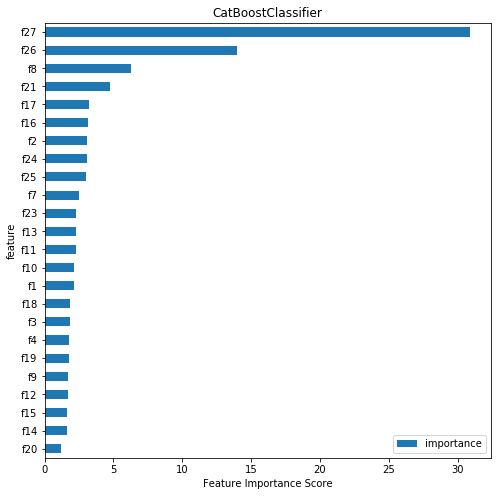

,importance
feature,
f20,1.182983
f14,1.641222
f15,1.661141
f12,1.696551
f9,1.710842
f19,1.742990
f4,1.756170
f3,1.823055
f18,1.828967


In [95]:
cat = CatBoostClassifier(eval_metric="AUC", logging_level="Silent")
cat.fit(X_features_add_trans, y)

plot_feature_importances(cat, X_features_add_trans, y, top_n=X.shape[1], title=cat.__class__.__name__)

In [59]:
for clf, label in zip([cat, cat_raw, lgbm, lgbm_raw, sclf_avg], 
                      ['Cat', 
                       'Cat Raw', 
                       'lgbm',
                       'lgbm_raw',
#                        'SVM',
#                        'kNN',
                       'StackingClassifier AVG']):

    scores = cross_val_score(clf, X_features_1, y, cv=5, scoring='roc_auc')
    print("AUC: %0.8f (+/- %0.8f) [%s]" 
          % (scores.mean(), scores.std(), label))

AUC: 0.93096742 (+/- 0.00434512) [Cat]
AUC: 0.93094853 (+/- 0.00451813) [Cat Raw]
AUC: 0.92832367 (+/- 0.00426134) [lgbm]
AUC: 0.92832367 (+/- 0.00426134) [lgbm_raw]
AUC: 0.93301310 (+/- 0.00418623) [StackingClassifier AVG]


In [57]:
for clf, label in zip([cat, cat_raw, lgbm, lgbm_raw, sclf, sclf_avg], 
                      ['Cat', 
                       'Cat Raw', 
                       'lgbm',
                       'lgbm_raw',
#                        'SVM',
#                        'kNN',
                       'StackingClassifier',
                       'StackingClassifier AVG']):

    scores = cross_val_score(clf, X_features_2, y, cv=5, scoring='roc_auc')
    print("AUC: %0.8f (+/- %0.8f) [%s]" 
          % (scores.mean(), scores.std(), label))

AUC: 0.93034086 (+/- 0.00422653) [Cat]
AUC: 0.93034266 (+/- 0.00417030) [Cat Raw]
AUC: 0.92856711 (+/- 0.00334167) [lgbm]
AUC: 0.92856711 (+/- 0.00334167) [lgbm_raw]
AUC: 0.91872558 (+/- 0.00357557) [StackingClassifier]
AUC: 0.93277679 (+/- 0.00376421) [StackingClassifier AVG]


In [62]:
for clf, label in zip([cat, cat_raw, lgbm, lgbm_raw, sclf_avg], 
                      ['Cat', 
                       'Cat Raw', 
                       'lgbm',
                       'lgbm_raw',
#                        'SVM',
#                        'kNN',
                       'StackingClassifier AVG']):

    scores = cross_val_score(clf, X_features_3, y, cv=5, scoring='roc_auc')
    print("AUC: %0.8f (+/- %0.8f) [%s]" 
          % (scores.mean(), scores.std(), label))

AUC: 0.93060988 (+/- 0.00434258) [Cat]
AUC: 0.93049189 (+/- 0.00408318) [Cat Raw]
AUC: 0.92970053 (+/- 0.00384401) [lgbm]
AUC: 0.92970053 (+/- 0.00384401) [lgbm_raw]
AUC: 0.93324307 (+/- 0.00427247) [StackingClassifier AVG]


In [ ]:
for clf, label in zip([cat, cat_raw, lgbm, lgbm_raw, sclf_avg], 
                      ['Cat', 
                       'Cat Raw', 
                       'lgbm',
                       'lgbm_raw',
#                        'SVM',
#                        'kNN',
                       'StackingClassifier AVG']):

    scores = cross_val_score(clf, X_features_4, y, cv=5, scoring='roc_auc')
    print("AUC: %0.8f (+/- %0.8f) [%s]" 
          % (scores.mean(), scores.std(), label))

In [81]:
for clf, label in zip([cat, cat_raw, lgbm, lgbm_raw, sclf_avg], 
                      ['Cat', 
                       'Cat Raw', 
                       'lgbm',
                       'lgbm_raw',
#                        'SVM',
#                        'kNN',
                       'StackingClassifier AVG']):

    scores = cross_val_score(clf, X_features_add_trans, y, cv=5, scoring='roc_auc')
    print("AUC: %0.8f (+/- %0.8f) [%s]" 
          % (scores.mean(), scores.std(), label))

AUC: 0.92985984 (+/- 0.00399140) [Cat]
AUC: 0.93037745 (+/- 0.00472593) [Cat Raw]
AUC: 0.93149434 (+/- 0.00357991) [lgbm]
AUC: 0.92759243 (+/- 0.00535865) [lgbm_raw]
AUC: 0.93228354 (+/- 0.00411302) [StackingClassifier AVG]


## Test

In [24]:
#%%
try:
    data = pd.read_csv("./data/testdata_nolabels.csv")
    print("Dataset has {} samples with {} features each.".format(*data.shape))
except:
    print("Dataset could not be loaded. Is the dataset missing?")
X_test = data.drop(['ID'], axis = 1, inplace=False)
X_test_minmax_transform = scaler.transform(X_test)
X_test_std_transform = scaler_std.transform(X_test)
X_test_rbs_transform = scaler_rbs.fit_transform(X_test)
X_test_new_raw = model_select_raw.transform(X_test)
X_test_new = model_select.transform(X_test_rbs_transform)

#X_test_selected_raw = X_test[X_test.columns.intersection(lgbm_features)]
#X_test_selected_tune = X_test[X_test.columns.intersection(lgbm_features2)]
X_test_selected_sbs = X_test[X_test.columns.intersection(lgbm_features_sbs)]

#lgbm_features_sbs
#%%
#y_prob = sclf.predict_proba(X_test_selected_sbs)
y_prob = sclf_pipe.predict_proba(X_test.as_matrix())

#%%
result = pd.DataFrame()
result['score'] = y_prob[:, 1]
result.index += 1
result.to_csv('./results/out_x_stacking_sbs_pipline_with_svm.csv', index_label='Id')
#%%


Dataset has 4000 samples with 28 features each.


# Voting

In [125]:
cat_selected_params = {'eval_metric':"AUC", 'bagging_temperature': 0.65, 'border_count': 130, 'depth': 10, 
                       'iterations': 2200, 'l2_leaf_reg': 20, 'learning_rate': 0.007, 'od_pval': 0, 
                       'thread_count': 2, 'logging_level':"Silent"}
cat_full_params = {'eval_metric':"AUC",'bagging_temperature': 0.5, 'border_count': 90, 'logging_level':"Silent",
                   'depth': 10, 'iterations': 2200, 'l2_leaf_reg': 15, 'learning_rate': 0.007}
lightgbm_selected_params = {'objective': 'binary','bagging_fraction': 0.6, 'bagging_freq': 1, 'feature_fraction': 0.75, 
                            'learning_rate': 0.02, 'max_bin': 300, 'max_depth': -1, 'min_data_in_leaf': 60, 
                            'num_iterations': 400, 'num_leaves': 15}
light_full_params = {'objective': 'binary','feature_fraction': 0.75, 'learning_rate': 0.02, 
                     'max_depth': -1, 'min_data_in_leaf': 80, 'num_iterations': 400, 'num_leaves': 20}
nn_selected_params = {'batch_size': 60, 'hidden_layer_sizes': (64, 16, 4), 'max_iter': 300}
xgb_selected_params = {'colsample_bytree': 0.9, 'gamma': 0.9, 'learning_rate': 0.1, 'max_depth': 4, 
                       'min_child_weight': 4, 'n_estimators': 170, 'reg_alpha': 3, 'subsample': 0.9}
xgb_alson_param = {'base_score':0.5, 'booster':'gbtree', 'colsample_bylevel':1,'colsample_bytree':1.0, 
                   'gamma':0, 'learning_rate':0.08, 'max_delta_step':0,'max_depth':5, 'min_child_weight':2, 
                   'missing':None, 'n_estimators':120,'n_jobs':6,'nthread':None, 'objective':'binary:logistic',
                   'reg_alpha':1.0, 'reg_lambda':1.0,'scale_pos_weight':0.8, 'silent':True,'subsample':0.7}
rf_params = {'n_jobs':1, 'criterion':'entropy', 'bootstrap': True, 'max_features': 8, 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 1500}
lr_avg_params = {'C': 3000, 'max_iter': 2000, 'solver': 'saga'}
lr_params = {'C': 1e-4, 'max_iter': 2000, 'solver': 'saga'}

svm_meta_avg_params = {'C': 100, 'gamma': 0.01, 'probability': True}

In [126]:
rf = RandomForestClassifier(**rf_params)

xgboost = XGBClassifier(**xgb_alson_param)
xgboost_simon = XGBClassifier(n_jobs=1, **xgb_selected_params)

xgboost_raw = XGBClassifier(n_jobs=1)

cat = CatBoostClassifier(**cat_selected_params)
cat_raw = CatBoostClassifier(thread_count=6,eval_metric="AUC", logging_level="Silent")
cat_meta = CatBoostClassifier(eval_metric="AUC", logging_level="Silent")

lgbm = LGBMClassifier(n_jobs=6,**lightgbm_selected_params)
lgbm_raw = LGBMClassifier(n_jobs=1)

nn = MLPClassifier(solver='lbfgs', **nn_selected_params)

svm = SVC(C=100000, gamma=0.0001, probability=True)
knn = KNeighborsClassifier(n_jobs=-1, n_neighbors=60)

svm_meta_avg = SVC(**svm_meta_avg_params)

In [119]:
eclf1 = VotingClassifier(estimators=[('cat', pipe_cat), ('cat_raw', pipe_cat_raw), ('lgbm', pipe_lgbm), 
                                     ('xgboost', pipe_xgboost),('svm', pipe_svm)], n_jobs=-1, voting='soft')

In [122]:
scores = cross_val_score(eclf1, X.as_matrix(), y, n_jobs=-1, cv=scv_10, scoring='roc_auc')
print("AUC: %0.8f (+/- %0.8f)" 
      % (scores.mean(), scores.std()))

# cat with 'od_pval': 1e-05
# AUC: 0.93331419 (+/- 0.00418461)

# 
# AUC: 0.93309314 (+/- 0.00403475)

AUC: 0.93317692 (+/- 0.00630800)


In [133]:
eclf1.fit(X_selected_sbs, y)

VotingClassifier(estimators=[('cat', <catboost.core.CatBoostClassifier object at 0x7f642b264400>), ('cat_raw', <catboost.core.CatBoostClassifier object at 0x7f642b264128>), ('lgbm', LGBMClassifier(bagging_fraction=0.6, bagging_freq=1, boosting_type='gbdt',
        class_weight=None, colsample_bytree=1.0, feature_fra...reg_alpha=1.0, reg_lambda=1.0, scale_pos_weight=0.8, seed=None,
       silent=True, subsample=0.7))],
         flatten_transform=None, n_jobs=-1, voting='soft', weights=None)

## Test

In [134]:
#%%
try:
    data = pd.read_csv("./data/testdata_nolabels.csv")
    print("Dataset has {} samples with {} features each.".format(*data.shape))
except:
    print("Dataset could not be loaded. Is the dataset missing?")
X_test = data.drop(['ID'], axis = 1, inplace=False)
X_test_minmax_transform = scaler.transform(X_test)
X_test_std_transform = scaler_std.transform(X_test)
X_test_rbs_transform = scaler_rbs.fit_transform(X_test)
X_test_new_raw = model_select_raw.transform(X_test)
X_test_new = model_select.transform(X_test_rbs_transform)

#X_test_selected_raw = X_test[X_test.columns.intersection(lgbm_features)]
#X_test_selected_tune = X_test[X_test.columns.intersection(lgbm_features2)]
X_test_selected_sbs = X_test[X_test.columns.intersection(lgbm_features_sbs)]

#lgbm_features_sbs
#%%
y_prob = eclf1.predict_proba(X_test_selected_sbs)

#%%
result = pd.DataFrame()
result['score'] = y_prob[:, 1]
result.index += 1
result.to_csv('./results/out_x_voting_sbs.csv', index_label='Id')
#%%


Dataset has 4000 samples with 28 features each.


# Runtime Analysis

In [83]:
X_train = X
y_train = y

In [97]:
dtree_param = {'criterion' :'gini','max_depth' : 1}
Ada_param = {'n_estimators' : 100, 'learning_rate' : 0.05, 'random_state':42}
RF_param = {'n_estimators':100,'max_depth':None, 'max_features':'auto','random_state' : 42,'n_jobs' : -1}
XGB_param = {'n_estimators': 130, 'max_depth': 5, 'learning_rate' : 0.1}

In [106]:
t1 = arrow.now()
dtree = DecisionTreeClassifier(**dtree_param)
Ada_classifier = AdaBoostClassifier()

Ada_auc = cross_val_score(Ada_classifier, X_train,y_train,cv=scv_3,scoring='roc_auc').mean()
print(Ada_auc)
t11 = arrow.now()
Ada_time = t11-t1

0.9074674539462674


In [102]:
Ada_classifier.fit(X, y)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=50, random_state=None)

In [103]:
Ada_classifier.predict_proba(X_test)

array([[0.48199363, 0.51800637],
       [0.4705604 , 0.5294396 ],
       [0.49058575, 0.50941425],
       ...,
       [0.48044565, 0.51955435],
       [0.53239206, 0.46760794],
       [0.51276228, 0.48723772]])

In [107]:
RF_classifier = RandomForestClassifier()
RF_auc = cross_val_score(RF_classifier, X_train,y_train,cv=scv_3,scoring='roc_auc')
print(RF_auc.mean())

0.8926273961842474


In [108]:
RF_classifier.fit(X, y)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [109]:
RF_classifier.predict_proba(X_test)

array([[0. , 1. ],
       [0.1, 0.9],
       [0.2, 0.8],
       ...,
       [0. , 1. ],
       [1. , 0. ],
       [0.8, 0.2]])

In [110]:
LR_classifier = LogisticRegression(C=1e5)
LR_auc = cross_val_score(LR_classifier, X_train,y_train,cv=10,scoring='roc_auc')
print(LR_auc.mean())

0.9043152013024913


In [111]:
LR_classifier.fit(X, y)

LogisticRegression(C=100000.0, class_weight=None, dual=False,
          fit_intercept=True, intercept_scaling=1, max_iter=100,
          multi_class='ovr', n_jobs=1, penalty='l2', random_state=None,
          solver='liblinear', tol=0.0001, verbose=0, warm_start=False)

In [112]:
LR_classifier.predict_proba(X_test)

array([[1.10646653e-03, 9.98893533e-01],
       [1.91671953e-04, 9.99808328e-01],
       [2.25586826e-01, 7.74413174e-01],
       ...,
       [3.07050004e-03, 9.96929500e-01],
       [9.43872964e-01, 5.61270363e-02],
       [8.80948223e-01, 1.19051777e-01]])

In [115]:
params = {'C':[1e6, 1e5, 1e4]}
grid_avg = GridSearchCV(estimator=LR_classifier, 
                    param_grid=params, 
                    cv=scv_3,
                    scoring='roc_auc', return_train_score=True, n_jobs=6, verbose = 1)
grid_avg.fit(X, y)
print(grid_avg.best_params_)
print(grid_avg.best_score_)

Fitting 3 folds for each of 3 candidates, totalling 9 fits


[Parallel(n_jobs=6)]: Done   9 out of   9 | elapsed:    0.4s finished


{'C': 10000.0}
0.9050765241151819


In [122]:
MNB_classifier = MultinomialNB(alpha=0.5)
MNB_auc = cross_val_score(MNB_classifier, X_train,y_train,cv=scv_3,scoring='roc_auc')
print(MNB_auc.mean())

0.7902241194201526


In [123]:
MNB_classifier.fit(X,y)

MultinomialNB(alpha=0.5, class_prior=None, fit_prior=True)

In [124]:
MNB_classifier.predict_proba(X_test)

array([[3.40192254e-07, 9.99999660e-01],
       [4.06057839e-08, 9.99999959e-01],
       [8.88611513e-03, 9.91113885e-01],
       ...,
       [2.73778324e-06, 9.99997262e-01],
       [8.06095513e-01, 1.93904487e-01],
       [2.46329845e-01, 7.53670155e-01]])

In [127]:
svc = SVC(probability=True)
svc_auc = cross_val_score(svc, X_train,y_train,cv=scv_3,scoring='roc_auc')
print(svc_auc.mean())



0.59072910201825


In [129]:
svc.fit(X, y)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=True, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [130]:
svc.predict_proba(X_test)

array([[0.5, 0.5],
       [0.5, 0.5],
       [0.5, 0.5],
       ...,
       [0.5, 0.5],
       [0.5, 0.5],
       [0.5, 0.5]])

In [138]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=100)
cross_val_score(knn, X_train,y_train,cv=scv_3,scoring='roc_auc').mean()

0.7665835782832305

In [139]:
knn.fit(X, y)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=100, p=2,
           weights='uniform')

In [140]:
knn.predict_proba(X_test)

array([[0.55, 0.45],
       [0.4 , 0.6 ],
       [0.6 , 0.4 ],
       ...,
       [0.44, 0.56],
       [0.69, 0.31],
       [0.77, 0.23]])

In [148]:
xgb = XGBClassifier()

cross_val_score(cat, X_train,y_train,cv=scv_3,n_jobs=-1,scoring='roc_auc').mean()

0.9299451463020117

In [149]:
xgb.fit(X,y)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=None, objective='binary:logistic', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1)

In [150]:
xgb.predict_proba(X_test)

array([[0.04849887, 0.95150113],
       [0.02940738, 0.9705926 ],
       [0.10352123, 0.8964788 ],
       ...,
       [0.03612447, 0.96387553],
       [0.9789199 , 0.02108005],
       [0.8355732 , 0.16442679]], dtype=float32)

In [144]:
cat = CatBoostClassifier(eval_metric="AUC", logging_level="Silent")
cross_val_score(cat, X_train,y_train,cv=scv_3,scoring='roc_auc').mean()

0.9300848759906613

In [145]:
cat.fit(X, y)

In [146]:
cat.predict_proba(X_test)

array([[0.05156121, 0.94843879],
       [0.02744156, 0.97255844],
       [0.09503611, 0.90496389],
       ...,
       [0.05070683, 0.94929317],
       [0.98731477, 0.01268523],
       [0.89841271, 0.10158729]])

In [152]:
light = LGBMClassifier(objective='binary')
cross_val_score(light, X_train,y_train,cv=scv_3, n_jobs=-1, scoring='roc_auc').mean()

0.9265555622761071

In [153]:
light.fit(X, y)

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
        learning_rate=0.1, max_depth=-1, min_child_samples=20,
        min_child_weight=0.001, min_split_gain=0.0, n_estimators=100,
        n_jobs=-1, num_leaves=31, objective='binary', random_state=None,
        reg_alpha=0.0, reg_lambda=0.0, silent=True, subsample=1.0,
        subsample_for_bin=200000, subsample_freq=1)

In [154]:
light.predict_proba(X_test)

array([[0.0352242 , 0.9647758 ],
       [0.01263392, 0.98736608],
       [0.0535023 , 0.9464977 ],
       ...,
       [0.048697  , 0.951303  ],
       [0.97913225, 0.02086775],
       [0.8089737 , 0.1910263 ]])